# Линейная регрессия и стохастический градиентный спуск

Задание основано на материалах лекций по линейной регрессии и градиентному спуску. Вы будете прогнозировать выручку компании в зависимости от уровня ее инвестиций в рекламу по TV, в газетах и по радио.

## Вы научитесь:
- решать задачу восстановления линейной регрессии
- реализовывать стохастический градиентный спуск для ее настройки
- решать задачу линейной регрессии аналитически

## Введение
Линейная регрессия - один из наиболее хорошо изученных методов машинного обучения, позволяющий прогнозировать значения количественного признака в виде линейной комбинации прочих признаков с параметрами - весами модели. Оптимальные (в смысле минимальности некоторого функционала ошибки) параметры линейной регрессии можно найти аналитически с помощью нормального уравнения или численно с помощью методов оптимизации.  

Линейная регрессия использует простой функционал качества - среднеквадратичную ошибку. Мы будем работать с выборкой, содержащей 3 признака. Для настройки параметров (весов) модели решается следующая задача:
$$\Large \frac{1}{\ell}\sum_{i=1}^\ell{{((w_0 + w_1x_{i1} + w_2x_{i2} +  w_3x_{i3}) - y_i)}^2} \rightarrow \min_{w_0, w_1, w_2, w_3},$$
где $x_{i1}, x_{i2}, x_{i3}$ - значения признаков $i$-го объекта, $y_i$ - значение целевого признака $i$-го объекта, $\ell$ - число объектов в обучающей выборке.

## Градиентный спуск
Параметры $w_0, w_1, w_2, w_3$, по которым минимизируется среднеквадратичная ошибка, можно находить численно с помощью градиентного спуска.
Градиентный шаг для весов будет выглядеть следующим образом:
$$\Large w_0 \leftarrow w_0 - \frac{2\eta}{\ell} \sum_{i=1}^\ell{{((w_0 + w_1x_{i1} + w_2x_{i2} +  w_3x_{i3}) - y_i)}}$$
$$\Large w_j \leftarrow w_j - \frac{2\eta}{\ell} \sum_{i=1}^\ell{{x_{ij}((w_0 + w_1x_{i1} + w_2x_{i2} +  w_3x_{i3}) - y_i)}},\ j \in \{1,2,3\}$$
Здесь $\eta$ - параметр, шаг градиентного спуска.

## Стохастический градиентный спуск
Проблема градиентного спуска, описанного выше, в том, что на больших выборках считать на каждом шаге градиент по всем имеющимся данным может быть очень вычислительно сложно. 
В стохастическом варианте градиентного спуска поправки для весов вычисляются только с учетом одного случайно взятого объекта обучающей выборки:
$$\Large w_0 \leftarrow w_0 - \frac{2\eta}{\ell} {((w_0 + w_1x_{k1} + w_2x_{k2} +  w_3x_{k3}) - y_k)}$$
$$\Large w_j \leftarrow w_j - \frac{2\eta}{\ell} {x_{kj}((w_0 + w_1x_{k1} + w_2x_{k2} +  w_3x_{k3}) - y_k)},\ j \in \{1,2,3\},$$
где $k$ - случайный индекс, $k \in \{1, \ldots, \ell\}$.

## Нормальное уравнение 
Нахождение вектора оптимальных весов $w$ может быть сделано и аналитически.
Мы хотим найти такой вектор весов $w$, чтобы вектор $y$, приближающий целевой признак, получался умножением матрицы $X$ (состоящей из всех признаков объектов обучающей выборки, кроме целевого) на вектор весов $w$. То есть, чтобы выполнялось матричное уравнение:
$$\Large y = Xw$$
Домножением слева на $X^T$ получаем:
$$\Large X^Ty = X^TXw$$
Это хорошо, поскольку теперь матрица $X^TX$ - квадратная, и можно найти решение (вектор $w$) в виде:
$$\Large w = {(X^TX)}^{-1}X^Ty$$
Матрица ${(X^TX)}^{-1}X^T$ - [*псевдообратная*](https://ru.wikipedia.org/wiki/Псевдообратная_матрица) для матрицы $X$. В NumPy такую матрицу можно вычислить с помощью функции [numpy.linalg.pinv](http://docs.scipy.org/doc/numpy-1.10.0/reference/generated/numpy.linalg.pinv.html).

Однако, нахождение псевдообратной матрицы - операция вычислительно сложная и нестабильная в случае малого определителя матрицы $X$ (проблема мультиколлинеарности). 
На практике лучше находить вектор весов $w$ решением матричного уравнения 
$$\Large X^TXw = X^Ty$$Это может быть сделано с помощью функции [numpy.linalg.solve](http://docs.scipy.org/doc/numpy-1.10.1/reference/generated/numpy.linalg.solve.html).

Но все же на практике для больших матриц $X$ быстрее работает градиентный спуск, особенно его стохастическая версия.

## Инструкции по выполнению

В начале напишем простую функцию для записи ответов в текстовый файл. Ответами будут числа, полученные в ходе решения этого задания, округленные до 3 знаков после запятой. Полученные файлы после выполнения задания надо отправить в форму на странице задания на Coursera.org.

In [2]:
def write_answer_to_file(answer, filename):
    with open(filename, 'w') as f_out:
        f_out.write(str(round(answer, 3)))

**1. Загрузите данные из файла *advertising.csv* в объект pandas DataFrame. [Источник данных](http://www-bcf.usc.edu/~gareth/ISL/data.html).**

In [3]:
import pandas as pd
adver_data = pd.read_csv('advertising.csv')

**Посмотрите на первые 5 записей и на статистику признаков в этом наборе данных.**

In [4]:
adver_data.head()

,TV,Radio,Newspaper,Sales
1,230.1,37.8,69.2,22.1
2,44.5,39.3,45.1,10.4
3,17.2,45.9,69.3,9.3
4,151.5,41.3,58.5,18.5
5,180.8,10.8,58.4,12.9


In [5]:
adver_data.plot(y='TV', kind='hist', 
           color='green',  title='Weight (pound.) distribution')

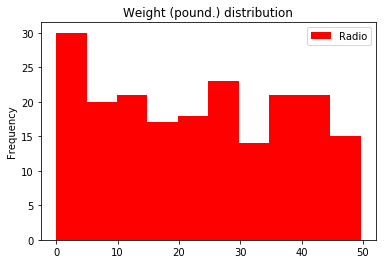

In [6]:
adver_data.plot(y='Radio', kind='hist', 
           color='red',  title='Weight (pound.) distribution')

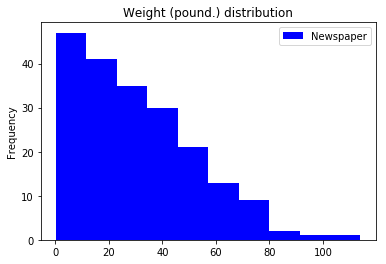

In [7]:
adver_data.plot(y='Newspaper', kind='hist', 
           color='blue',  title='Weight (pound.) distribution')

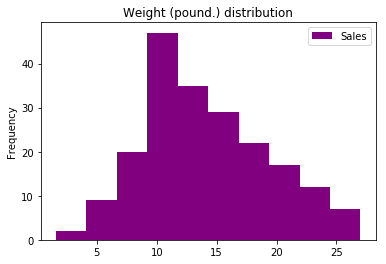

In [8]:
adver_data.plot(y='Sales', kind='hist', 
           color='purple',  title='Weight (pound.) distribution')

**Создайте массивы NumPy *X* из столбцов TV, Radio и Newspaper и *y* - из столбца Sales. Используйте атрибут *values* объекта pandas DataFrame.**

In [9]:
import numpy as np
X = np.array([adver_data.TV.values, adver_data.Radio.values, adver_data.Newspaper.values]).T
y = np.array(adver_data.Sales.values)
print(X)
print(y)

[[230.1  37.8  69.2]
 [ 44.5  39.3  45.1]
 [ 17.2  45.9  69.3]
 [151.5  41.3  58.5]
 [180.8  10.8  58.4]
 [  8.7  48.9  75. ]
 [ 57.5  32.8  23.5]
 [120.2  19.6  11.6]
 [  8.6   2.1   1. ]
 [199.8   2.6  21.2]
 [ 66.1   5.8  24.2]
 [214.7  24.    4. ]
 [ 23.8  35.1  65.9]
 [ 97.5   7.6   7.2]
 [204.1  32.9  46. ]
 [195.4  47.7  52.9]
 [ 67.8  36.6 114. ]
 [281.4  39.6  55.8]
 [ 69.2  20.5  18.3]
 [147.3  23.9  19.1]
 [218.4  27.7  53.4]
 [237.4   5.1  23.5]
 [ 13.2  15.9  49.6]
 [228.3  16.9  26.2]
 [ 62.3  12.6  18.3]
 [262.9   3.5  19.5]
 [142.9  29.3  12.6]
 [240.1  16.7  22.9]
 [248.8  27.1  22.9]
 [ 70.6  16.   40.8]
 [292.9  28.3  43.2]
 [112.9  17.4  38.6]
 [ 97.2   1.5  30. ]
 [265.6  20.    0.3]
 [ 95.7   1.4   7.4]
 [290.7   4.1   8.5]
 [266.9  43.8   5. ]
 [ 74.7  49.4  45.7]
 [ 43.1  26.7  35.1]
 [228.   37.7  32. ]
 [202.5  22.3  31.6]
 [177.   33.4  38.7]
 [293.6  27.7   1.8]
 [206.9   8.4  26.4]
 [ 25.1  25.7  43.3]
 [175.1  22.5  31.5]
 [ 89.7   9.9  35.7]
 [239.9  41.5

**Отмасштабируйте столбцы матрицы *X*, вычтя из каждого значения среднее по соответствующему столбцу и поделив результат на стандартное отклонение. Для определенности, используйте методы mean и std векторов NumPy (реализация std в Pandas может отличаться). Обратите внимание, что в numpy вызов функции .mean() без параметров возвращает среднее по всем элементам массива, а не по столбцам, как в pandas. Чтобы произвести вычисление по столбцам, необходимо указать параметр axis.**

In [10]:
means, stds = np.mean(X,axis = 0), np.std(X,axis=0)

In [11]:
Xscale = (X - means)/stds
X.shape
print(Xscale)

[[ 9.69852266e-01  9.81522472e-01  1.77894547e+00]
 [-1.19737623e+00  1.08280781e+00  6.69578760e-01]
 [-1.51615499e+00  1.52846331e+00  1.78354865e+00]
 [ 5.20496822e-02  1.21785493e+00  1.28640506e+00]
 [ 3.94182198e-01 -8.41613655e-01  1.28180188e+00]
 [-1.61540845e+00  1.73103399e+00  2.04592999e+00]
 [-1.04557682e+00  6.43904671e-01 -3.24708413e-01]
 [-3.13436589e-01 -2.47406325e-01 -8.72486994e-01]
 [-1.61657614e+00 -1.42906863e+00 -1.36042422e+00]
 [ 6.16042873e-01 -1.39530685e+00 -4.30581584e-01]
 [-9.45155670e-01 -1.17923146e+00 -2.92486143e-01]
 [ 7.90028350e-01  4.96973404e-02 -1.22232878e+00]
 [-1.43908760e+00  7.99208859e-01  1.62704048e+00]
 [-5.78501712e-01 -1.05768905e+00 -1.07502697e+00]
 [ 6.66253447e-01  6.50657027e-01  7.11007392e-01]
 [ 5.64664612e-01  1.65000572e+00  1.02862691e+00]
 [-9.25304978e-01  9.00494200e-01  3.84117072e+00]
 [ 1.56887609e+00  1.10306488e+00  1.16211917e+00]
 [-9.08957349e-01 -1.86635121e-01 -5.64073843e-01]
 [ 3.00679600e-03  4.29449843e-

**Добавьте к матрице *X* столбец из единиц, используя методы *hstack*, *ones* и *reshape* библиотеки NumPy. Вектор из единиц нужен для того, чтобы не обрабатывать отдельно коэффициент $w_0$ линейной регрессии.**

In [12]:
import numpy as np
X = np.hstack((X, np.ones(X.shape[0]).reshape(X.shape[0],1)))
print(X)

[[230.1  37.8  69.2   1. ]
 [ 44.5  39.3  45.1   1. ]
 [ 17.2  45.9  69.3   1. ]
 [151.5  41.3  58.5   1. ]
 [180.8  10.8  58.4   1. ]
 [  8.7  48.9  75.    1. ]
 [ 57.5  32.8  23.5   1. ]
 [120.2  19.6  11.6   1. ]
 [  8.6   2.1   1.    1. ]
 [199.8   2.6  21.2   1. ]
 [ 66.1   5.8  24.2   1. ]
 [214.7  24.    4.    1. ]
 [ 23.8  35.1  65.9   1. ]
 [ 97.5   7.6   7.2   1. ]
 [204.1  32.9  46.    1. ]
 [195.4  47.7  52.9   1. ]
 [ 67.8  36.6 114.    1. ]
 [281.4  39.6  55.8   1. ]
 [ 69.2  20.5  18.3   1. ]
 [147.3  23.9  19.1   1. ]
 [218.4  27.7  53.4   1. ]
 [237.4   5.1  23.5   1. ]
 [ 13.2  15.9  49.6   1. ]
 [228.3  16.9  26.2   1. ]
 [ 62.3  12.6  18.3   1. ]
 [262.9   3.5  19.5   1. ]
 [142.9  29.3  12.6   1. ]
 [240.1  16.7  22.9   1. ]
 [248.8  27.1  22.9   1. ]
 [ 70.6  16.   40.8   1. ]
 [292.9  28.3  43.2   1. ]
 [112.9  17.4  38.6   1. ]
 [ 97.2   1.5  30.    1. ]
 [265.6  20.    0.3   1. ]
 [ 95.7   1.4   7.4   1. ]
 [290.7   4.1   8.5   1. ]
 [266.9  43.8   5.    1. ]
 

**2. Реализуйте функцию *mserror* - среднеквадратичную ошибку прогноза. Она принимает два аргумента - объекты Series *y* (значения целевого признака) и *y\_pred* (предсказанные значения). Не используйте в этой функции циклы - тогда она будет вычислительно неэффективной.**

In [13]:
print(y)
print(np.median(y))
print(np.median(y)-y)

[22.1 10.4  9.3 18.5 12.9  7.2 11.8 13.2  4.8 10.6  8.6 17.4  9.2  9.7
 19.  22.4 12.5 24.4 11.3 14.6 18.  12.5  5.6 15.5  9.7 12.  15.  15.9
 18.9 10.5 21.4 11.9  9.6 17.4  9.5 12.8 25.4 14.7 10.1 21.5 16.6 17.1
 20.7 12.9  8.5 14.9 10.6 23.2 14.8  9.7 11.4 10.7 22.6 21.2 20.2 23.7
  5.5 13.2 23.8 18.4  8.1 24.2 15.7 14.  18.   9.3  9.5 13.4 18.9 22.3
 18.3 12.4  8.8 11.  17.   8.7  6.9 14.2  5.3 11.  11.8 12.3 11.3 13.6
 21.7 15.2 12.  16.  12.9 16.7 11.2  7.3 19.4 22.2 11.5 16.9 11.7 15.5
 25.4 17.2 11.7 23.8 14.8 14.7 20.7 19.2  7.2  8.7  5.3 19.8 13.4 21.8
 14.1 15.9 14.6 12.6 12.2  9.4 15.9  6.6 15.5  7.  11.6 15.2 19.7 10.6
  6.6  8.8 24.7  9.7  1.6 12.7  5.7 19.6 10.8 11.6  9.5 20.8  9.6 20.7
 10.9 19.2 20.1 10.4 11.4 10.3 13.2 25.4 10.9 10.1 16.1 11.6 16.6 19.
 15.6  3.2 15.3 10.1  7.3 12.9 14.4 13.3 14.9 18.  11.9 11.9  8.  12.2
 17.1 15.   8.4 14.5  7.6 11.7 11.5 27.  20.2 11.7 11.8 12.6 10.5 12.2
  8.7 26.2 17.6 22.6 10.3 17.3 15.9  6.7 10.8  9.9  5.9 19.6 17.3  7.6
  9.7 1

In [14]:
def mserror(y, y_pred):
    l = len(y)
    return(np.sum((y_pred-y)**2)/l)

**Какова среднеквадратичная ошибка прогноза значений Sales, если всегда предсказывать медианное значение Sales по исходной выборке? Запишите ответ в файл '1.txt'.**

In [15]:
answer1 = mserror(y,np.median(y))
print(answer1)
write_answer_to_file(answer1, '1.txt')

28.34575


**3. Реализуйте функцию *normal_equation*, которая по заданным матрицам (массивам NumPy) *X* и *y* вычисляет вектор весов $w$ согласно нормальному уравнению линейной регрессии.**

In [16]:
def normal_equation(X, y):
    return np.linalg.inv(X.T.dot(X)).dot(X.T).dot(y)

In [17]:
np.linalg.inv(X.T.dot(X)).dot(X.T).dot(y)
#X.T.dot(y).shape


array([ 4.57646455e-02,  1.88530017e-01, -1.03749304e-03,  2.93888937e+00])

In [18]:
norm_eq_weights = normal_equation(X, y)
print(norm_eq_weights)
print(len(norm_eq_weights))

[ 4.57646455e-02  1.88530017e-01 -1.03749304e-03  2.93888937e+00]
4


**Какие продажи предсказываются линейной моделью с весами, найденными с помощью нормального уравнения, в случае средних инвестиций в рекламу по ТВ, радио и в газетах? (то есть при нулевых значениях масштабированных признаков TV, Radio и Newspaper). Запишите ответ в файл '2.txt'.**

In [19]:
answer2 = np.mean(X,axis=0).dot(norm_eq_weights)
print(answer2)
write_answer_to_file(answer2, '2.txt')

14.022499999999997


**4. Напишите функцию *linear_prediction*, которая принимает на вход матрицу *X* и вектор весов линейной модели *w*, а возвращает вектор прогнозов в виде линейной комбинации столбцов матрицы *X* с весами *w*.**

In [20]:
def linear_prediction(X, w):
    return X.dot(w)

**Какова среднеквадратичная ошибка прогноза значений Sales в виде линейной модели с весами, найденными с помощью нормального уравнения? Запишите ответ в файл '3.txt'.**

In [21]:
answer3 = mserror(y,linear_prediction(X,norm_eq_weights))
print(answer3)
write_answer_to_file(answer3, '3.txt')

2.784126314510936


**5. Напишите функцию *stochastic_gradient_step*, реализующую шаг стохастического градиентного спуска для линейной регрессии. Функция должна принимать матрицу *X*, вектора *y* и *w*, число *train_ind* - индекс объекта обучающей выборки (строки матрицы *X*), по которому считается изменение весов, а также число *$\eta$* (eta) - шаг градиентного спуска (по умолчанию *eta*=0.01). Результатом будет вектор обновленных весов. Наша реализация функции будет явно написана для данных с 3 признаками, но несложно модифицировать для любого числа признаков, можете это сделать.**

In [47]:
y.shape


(200,)

In [45]:
def stochastic_gradient_step(X, y, w, train_ind, eta=0.01):
    print("w=",w)
    l = X.shape[0]
    print("l=",l)
    x = X[train_ind]
    print("x=",x)
    y_pred = linear_prediction(x,w)
    print("y_pred=",y_pred)
    rs = y_pred - y[train_ind]
    print("rs=",rs)
    return  w - 2.0*eta/l*x*rs
    
    
    


In [46]:
c = [0,0,0,0]
for i in range(100):
    random_ind = np.random.randint(X.shape[0])
    print("random_ind=",random_ind)
    z = stochastic_gradient_step(X,y,c,random_ind,0.01)
    c = z
    print("new_w=",c)
    print("")
    i +=1
    

random_ind= 185
w= [0, 0, 0, 0]
l= 200
x= [205.   45.1  19.6   1. ]
y_pred= 0.0
rs= -22.6
new_w= [92.66   20.3852  8.8592  0.452 ]

random_ind= 80
w= [92.66   20.3852  8.8592  0.452 ]
l= 200
x= [76.4 26.7 22.3  1. ]
y_pred= 7821.521000000001
rs= 7809.7210000000005
new_w= [-11840.593688  -4150.005814  -3474.276366   -155.74242 ]

random_ind= 73
w= [-11840.593688  -4150.005814  -3474.276366   -155.74242 ]
l= 200
x= [129.4   5.7  31.3   1. ]
y_pred= -1664728.4490428003
rs= -1664739.4490428003
new_w= [4296505.10043477  185630.29137688 1038652.61873479   33139.04656086]

random_ind= 151
w= [4296505.10043477  185630.29137688 1038652.61873479   33139.04656086]
l= 200
x= [121.    8.4  48.7   1. ]
y_pred= 572051933.1791179
rs= 572051921.5791179
new_w= [-1.38006915e+09 -9.59190925e+07 -5.56139919e+08 -1.14078994e+07]

random_ind= 183
w= [-1.38006915e+09 -9.59190925e+07 -5.56139919e+08 -1.14078994e+07]
l= 200
x= [287.6  43.   71.8   1. ]
y_pred= -440974661199.30334
rs= -440974661225.50336
new_w= 

**6. Напишите функцию *stochastic_gradient_descent*, реализующую стохастический градиентный спуск для линейной регрессии. Функция принимает на вход следующие аргументы:**
- X - матрица, соответствующая обучающей выборке
- y - вектор значений целевого признака
- w_init - вектор начальных весов модели
- eta - шаг градиентного спуска (по умолчанию 0.01)
- max_iter - максимальное число итераций градиентного спуска (по умолчанию 10000)
- max_weight_dist - максимальное евклидово расстояние между векторами весов на соседних итерациях градиентного спуска,
при котором алгоритм прекращает работу (по умолчанию 1e-8)
- seed - число, используемое для воспроизводимости сгенерированных псевдослучайных чисел (по умолчанию 42)
- verbose - флаг печати информации (например, для отладки, по умолчанию False)

**На каждой итерации в вектор (список) должно записываться текущее значение среднеквадратичной ошибки. Функция должна возвращать вектор весов $w$, а также вектор (список) ошибок.**

In [52]:
def stochastic_gradient_descent(X, y, w_init, eta=1e-2, max_iter=1e4,
                                min_weight_dist=1e-8, seed=42, verbose=False):
    # Инициализируем расстояние между векторами весов на соседних
    # итерациях большим числом. 
    weight_dist = np.inf
    # Инициализируем вектор весов
    w = w_init
    # Сюда будем записывать ошибки на каждой итерации
    errors = []
    # Счетчик итераций
    iter_num = 0
    # Будем порождать псевдослучайные числа 
    # (номер объекта, который будет менять веса), а для воспроизводимости
    # этой последовательности псевдослучайных чисел используем seed.
    np.random.seed(seed)

    # Основной цикл
    while weight_dist > min_weight_dist and iter_num < max_iter:
        # порождаем псевдослучайный 
        # индекс объекта обучающей выборки
        random_ind = np.random.randint(X.shape[0])
        errors.append(mserror(y,linear_prediction(X,w)))
        w_new = stochastic_gradient_step(X,y,w,random_ind,eta)
        w = w_new
        iter_num += 1
    return w, errors
 

 **Запустите $10^5$ итераций стохастического градиентного спуска. Укажите вектор начальных весов *w_init*, состоящий из нулей. Оставьте параметры  *eta* и *seed* равными их значениям по умолчанию (*eta*=0.01, *seed*=42 - это важно для проверки ответов).**

In [53]:
%%time

w_init = [0]*len(norm_eq_weights)
stoch_grad_desc_weights, stoch_errors_by_iter = stochastic_gradient_descent(X, y, w_init, 
                                                                            eta=1e-2, 
                                                                            max_iter=1e5,
                                                                            min_weight_dist=1e-8,
                                                                            seed=42, 
                                                                            verbose=True)

print(stoch_errors_by_iter)


w= [0, 0, 0, 0]
l= 200
x= [280.2  10.1  21.4   1. ]
y_pred= 0.0
rs= -14.8
w= [82.9392  2.9896  6.3344  0.296 ]
l= 200
x= [165.6  10.   17.6   1. ]
y_pred= 13876.40896
rs= 13863.80896
w= [-45833.99607552  -2769.772192    -4873.72635392   -276.9801792 ]
l= 200
x= [217.7  33.5  59.    1. ]
y_pred= -10358675.149133183
rs= -10358694.549133183
w= [45055922.07085036  6937555.57572723 12218385.84162324   206896.91080346]
l= 200
x= [204.1  32.9  46.    1. ]
y_pred= 9986411918.727457
rs= 9986411899.727457
w= [-4.07194775e+10 -6.56412147e+09 -9.17528056e+09 -1.99521341e+08]
l= 200
x= [25.  11.  29.7  1. ]
y_pred= -1362897626564.0505
rs= -1362897626571.2505
w= [6.40729336e+11 2.93273356e+11 8.00385910e+11 2.70584312e+10]
l= 200
x= [109.8  14.3  31.7   1. ]
y_pred= 99945181836762.14
rs= 99945181836749.73
w= [-2.18838890e+14 -2.82910486e+13 -6.25648594e+13 -1.97184521e+12]
l= 200
x= [286.   13.9   3.7   1. ]
y_pred= -6.32146299347263e+16
rs= -6.321462993472632e+16
w= [3.61368844e+17 1.75453761e+16 4

l= 200
x= [184.9  43.9   1.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [94.2  4.9  8.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [266.9  43.8   5.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.7  18.4  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [8.6 2.1 1.  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [289.7  42.3  51.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1   7.3   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.9  41.5  18.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 0.7 39.6  8.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [121.    8.4  48.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [182.6  46.2  58.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.4 16.  22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [172.5  1

/home/erossy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in square
  This is separate from the ipykernel package so we can avoid doing imports until
/home/erossy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in subtract
  # This is added back by InteractiveShellApp.init_path()


rs= nan
w= [nan nan nan nan]
l= 200
x= [120.2  19.6  11.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [142.9  29.3  12.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [142.9  29.3  12.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [70.6 16.  40.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1  16.7  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.5 10.8  6.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [94.2  4.9  8.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [53.5  2.  21.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.9  41.5  18.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1   7.3   8.7   1. ]
y_pred= nan
rs= nan
w= [nan

w= [nan nan nan nan]
l= 200
x= [75.5 10.8  6.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.4  30.2  20.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [289.7  42.3  51.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [290.7   4.1   8.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.3  31.6  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [121.    8.4  48.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.7 12.1 23.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [266.9  43.8   5.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [214.7  24.    4.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.7  15.4   2.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [56.2  5.7 29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [23.8 35.1 65.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan

w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [180.8  10.8  58.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [28.6  1.5 33.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [284.3  10.6   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [53.5  2.  21.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4   5.1  23.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.  40.3 11.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.8  43.9  27.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [230.1  37.8  69.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [214.7  24.    4.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  47.8  51.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.1  22.5  31.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan

w= [nan nan nan nan]
l= 200
x= [109.8  14.3  31.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.8 38.9 50.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [137.9  46.4  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [28.6  1.5 33.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [292.9  28.3  43.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.6 39.   9.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.8  27.1  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.   37.7  32.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.1  5.8 24.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

rs= nan
w= [nan nan nan nan]
l= 200
x= [210.8  49.6  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [171.3  39.7  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.1  0.4 25.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.9   3.5  19.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [89.7  9.9 35.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   2.6  21.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [195.4  47.7  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [283.6  42.   66.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [96.2 14.8 38.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.9   3.5  19.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.2  18.4  65.7   1. ]
y_pred= nan
rs= nan
w= 

w= [nan nan nan nan]
l= 200
x= [93.9 43.5 50.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.4  24.6  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.1 35.  52.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [59.6 12.  43.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   3.4  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [68.4 44.5 35.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4   5.1  23.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [142.9  29.3  12.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.7  35.6   6.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4 26.7 22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [87.2 11.8 25.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [287.6  43.   71.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

w= [nan nan nan nan]
l= 200
x= [125.7  36.9  79.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [95.7  1.4  7.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.    9.3   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.8  49.6  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4  27.5  11.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [172.5  18.1  30.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [214.7  24.    4.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [147.3  23.9  19.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [156.6   2.6   8.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [293.6  27.7   1.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [87.2 11.8 25.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.9 11.7 36.8  1. ]
y_pred= nan
rs= nan
w= [nan nan

w= [nan nan nan nan]
l= 200
x= [59.6 12.  43.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [164.5  20.9  47.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.5 39.3 45.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [296.4  36.3 100.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [95.7  1.4  7.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  21.   22.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [70.6 16.  40.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.1 35.  52.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.2  19.6  11.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.7 25.8 20.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.9   8.4  26.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [205.   45.1  19.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [290.7   4.1   8.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

w= [nan nan nan nan]
l= 200
x= [215.4  23.6  57.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [125.7  36.9  79.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.7 12.1 23.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [209.6  20.6  10.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   2.6  21.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.  40.3 11.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.5  36.8   7.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  43.9   1.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [134.3   4.9   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.5 39.3 45.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4  0.8 14.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [23.8 35.1 65.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

w= [nan nan nan nan]
l= 200
x= [287.6  43.   71.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.  11.  29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [68.4 44.5 35.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.  11.  29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [253.8  21.3  30.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.2  3.7 13.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [170.2   7.8  35.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [172.5  18.1  30.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [57.5 32.8 23.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.8  43.9  27.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.8 38.9 50.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 0.7 39.6  8.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [284.3  10.6   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.2 20.5 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1  16.7  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.6 20.1 17.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.1  30.6  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.3  15.5  27.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [26.8 33.  19.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [123.1  34.6  12.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [125.7  36.9  79.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [141.3  26.8  46.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.2 20.5 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

x= [117.2  14.7   5.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [57.5 32.8 23.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.2  3.7 13.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [117.2  14.7   5.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2  4.1 31.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [89.7  9.9 35.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.2 20.5 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [93.9 43.5 50.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [140.3   1.9   9.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [188.4  18.1  25.6  

w= [nan nan nan nan]
l= 200
x= [149.8   1.3  24.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [156.6   2.6   8.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [23.8 35.1 65.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1   7.3   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.4  41.7  39.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.2 20.5 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [292.9  28.3  43.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4 26.7 22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [56.2  5.7 29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.2 15.9 49.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200

x= [164.5  20.9  47.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [90.4  0.3 23.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [172.5  18.1  30.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.4  24.6  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [27.5  1.6 20.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.9 11.7 36.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.1  5.8 24.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [107.4  14.   10.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 4.1 11.6  5.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.8  43.9  27.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [215.4  23.6  57.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [195.4  47.7  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.3  14.5  10.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [289.7  42.3  51

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [102.7  29.6   8.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.7 12.1 23.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1   7.3   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [224.    2.4  15.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [293.6  27.7   1.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [107.4  14.   10.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.2  3.7 13.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [164.5  20.9  47.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.5 39.3 45.1  1. ]
y_pred= nan
rs=

w= [nan nan nan nan]
l= 200
x= [262.7  28.8  15.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.1  22.5  31.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.7  28.8  15.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.3  31.6  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [290.7   4.1   8.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [255.4  26.9   5.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.4  30.2  20.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [137.9  46.4  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [136.2  19.2  16.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.1 26.7 35.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan

rs= nan
w= [nan nan nan nan]
l= 200
x= [163.3  31.6  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [188.4  18.1  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 5.4 29.9  9.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [180.8  10.8  58.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.7  29.5   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.4 16.  22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.1  22.5  31.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [170.2   7.8  35.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.9  48.9  41.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [219.8  33.5  45.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [255.4  26.9   5.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.5   2.1  26.6   1. ]
y_pred= nan
rs= nan

x= [38.2  3.7 13.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.5   2.1  26.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [261.3  42.7  54.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [73.4 17.  12.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.1  0.4 25.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4 26.7 22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [219.8  33.5  45.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [27.5  1.6 20.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  47.8  51.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.5  7.6  7.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [107.4  14.   10.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [182.6  46.2  58.7   1. 

w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [16.9 43.7 89.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.3  49.    3.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [56.2  5.7 29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4   5.1  23.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.   37.7  32.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   4.3  49.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.3  49.    3.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [39.5 41.1  5.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.5   5.4  27.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [284.3  10.6   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan

x= [253.8  21.3  30.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [8.6 2.1 1.  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.2   2.9  43.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.9 11.7 36.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [180.8  10.8  58.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.3 27.5 16.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [87.2 11.8 25.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.4  24.6  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [117.2  14.7   5.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4   5.1  23

x= [284.3  10.6   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [289.7  42.3  51.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  14.3  31.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.5   2.1  26.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [100.4   9.6   3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4  0.8 14.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   3.4  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.4 16.  22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [57.5 32.8 23.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.1  5.8 24.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.2  10.1  21.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [53.5  2.  21.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.3  14.5  10

w= [nan nan nan nan]
l= 200
x= [76.4  0.8 14.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.   9.3  0.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.1 25.7 43.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [209.6  20.6  10.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   3.4  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.3  15.5  27.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [16.9 43.7 89.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [209.6  20.6  10.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [56.2  5.7 29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  47.8  51.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.9  48.9  41.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [182.6  46.2  58.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [287.6  43.   71.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.2  10.1  21.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.8  49.6  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  14.3  31.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [147.3  23.9  19.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.8  49.6  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200

w= [nan nan nan nan]
l= 200
x= [13.2 15.9 49.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.2 15.9 49.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [171.3  39.7  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [36.9 38.6 65.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 5.4 29.9  9.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.9   8.4  26.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [142.9  29.3  12.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.9   3.5  19.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [290.7   4.1   8.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.1  0.4 25.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.7  28.8  15.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.5 10.8  6.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

w= [nan nan nan nan]
l= 200
x= [284.3  10.6   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [73.4 17.  12.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  21.   22.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [137.9  46.4  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.5  43.   33.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [141.3  26.8  46.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.2   2.9  43.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [94.2  4.9  8.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.2 20.5 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [59.6 12.  43.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [214.7  24.    4.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4 26.7 22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

w= [nan nan nan nan]
l= 200
x= [239.9  41.5  18.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [293.6  27.7   1.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  21.   22.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [56.2  5.7 29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.4  30.2  20.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [123.1  34.6  12.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [253.8  21.3  30.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.5  33.2  37.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [142.9  29.3  12.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.2  3.7 13.8  1. ]
y_pred= nan
rs= nan
w= [nan

w= [nan nan nan nan]
l= 200
x= [216.8  43.9  27.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [170.2   7.8  35.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   4.3  49.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.7  18.4  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.7  35.6   6.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2 45.9 69.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.2  18.4  65.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [129.4   5.7  31.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [31.5 24.6  2.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [16.9 43.7 89.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [217.7  33.5  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.9  48.9  41.8   1. ]
y_pred= nan
rs= nan
w= [nan nan

x= [177.   33.4  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.5  36.8   7.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [238.2  34.3   5.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [142.9  29.3  12.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [136.2  19.2  16.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.1  22.5  31.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.   9.3  0.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [26.8 33.  19.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.2  14.3  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.8  21.1   9.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.3  49.    3.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.3 27.5 16.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [129.4   5.7

w= [nan nan nan nan]
l= 200
x= [228.   37.7  32.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.9   3.5  19.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [142.9  29.3  12.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.7 12.1 23.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.3 20.3 32.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [80.2  0.   9.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [170.2   7.8  35.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [284.3  10.6   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [93.9 43.5 50.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.9 37.6 21.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [215.4  23.6  57.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.2  1.5 30.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [57.5 32.8 23.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [195.4  47.7  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [195.4  47.7  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.8   5.2  19.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [214.7  24.    4.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [95.7  1.4  7.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [170.2   7.8  35.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [50.  11.6 18.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 67.8  36.6 114.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [219.8  

w= [nan nan nan nan]
l= 200
x= [44.5 39.3 45.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.5 39.3 45.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [217.7  33.5  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [56.2  5.7 29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [232.1   8.6   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   4.3  49.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.7 48.9 75.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.8 38.9 50.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.9  17.2  17.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

w= [nan nan nan nan]
l= 200
x= [195.4  47.7  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [232.1   8.6   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [140.3   1.9   9.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [165.6  10.   17.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.9  48.9  41.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [50.  11.6 18.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.1 26.7 35.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.4  30.2  20.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.7  15.4   2.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  43.9   1.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [273.7  28.9  59.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.1  30.6  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [255.4  26.9   5.5   1. ]
y_pred= nan
rs= nan
w= [nan

w= [nan nan nan nan]
l= 200
x= [121.    8.4  48.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.5   5.4  27.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.9   3.5  19.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [166.8  42.    3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [234.5   3.4  84.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.4  24.6  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [188.4  18.1  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [293.6  27.7   1.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.8  27.1  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [117.2  14.7   5.4   1. ]
y_pred= nan
rs= nan

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4   5.1  23.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.2 20.5 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [11.7 36.9 45.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.9   3.5  19.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [284.3  10.6   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [215.4  23.6  57.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.2 15.9 49.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [89.7  9.9 35.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [23.8 35.1 65.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.   9.3  0.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [166.8  42.    3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [104.6   5.7  34.4   1. ]
y_pred= nan
rs= nan
w= [nan

x= [140.3   1.9   9.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [250.9  36.5  72.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.3  15.5  27.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [68.4 44.5 35.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [214.7  24.    4.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.  40.3 11.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.1  5.8 24.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [102.7  29.6   8.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [87.2 11.8 25.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.9 11.7 36.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.7 12.1 23.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred

x= [ 0.7 39.6  8.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4  0.8 14.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [56.2  5.7 29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.5  7.6  7.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [205.   45.1  19.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.5  33.2  37.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.5 39.3 45.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [102.7  29.6   8.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [283.6  42.   66.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [135.2  41.7  45.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [209.6  20.6  10.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.8  21.1   9

l= 200
x= [172.5  18.1  30.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.7 25.8 20.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.9  48.9  41.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 0.7 39.6  8.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.5  43.   33.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.2  3.7 13.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [50.  11.6 18.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.9   3.5  19.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [74.7 49.4 45.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [110.7  40.6 

w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [224.    2.4  15.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [57.5 32.8 23.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4  27.5  11.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4  27.5  11.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4 26.7 22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [70.6 16.  40.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [26.8 33.  19.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.7 48.9 75.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1   7.3   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.   9.3  0.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   2.6  21.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200

x= [209.6  20.6  10.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [140.3   1.9   9.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.3  14.5  10.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.8 38.9 50.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [36.9 38.6 65.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [209.6  20.6  10.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.2  19.6  11.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [102.7  29.6   8.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [36.9 38.6 65.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.   37.7  32.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2 45.9 69.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [96.2 14.8 38.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [166.8  42.    3

x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [8.6 2.1 1.  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [209.6  20.6  10.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [290.7   4.1   8.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [290.7   4.1   8.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.9  41.5  18.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [125.7  36.9  79.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [107.4  14.   10.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.8  43.9  27.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [129.4   5.7  31.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139

x= [ 67.8  36.6 114.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.6 39.   9.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [85.7 35.8 49.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.6 20.1 17.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [8.6 2.1 1.  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [36.9 38.6 65.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [104.6   5.7  34.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.2 20.5 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [219.8  33.5  45.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [209.6  20.6  10.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.  25.9 20.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [229.5  32.3  74.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [53.5  2.  21.4  1. ]
y_pred

w= [nan nan nan nan]
l= 200
x= [172.5  18.1  30.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [36.9 38.6 65.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2  4.1 31.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2 45.9 69.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 5.4 29.9  9.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [107.4  14.   10.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.5   5.4  27.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [224.    2.4  15.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.5   2.1  26.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.7 48.9 75.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [93.9 43.5 50.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 67.8  36.6 114.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.2  14.3  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [137.9  46.4  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1   7.3   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [232.1   8.6   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.2  1.5 30.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.9   8.4  26.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [117.2  14.7   5.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [290.7   4.1   8.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4 26.7 22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [110.7  40.6  63.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.  40.3 11.9  1. ]
y_pred= nan
rs=

w= [nan nan nan nan]
l= 200
x= [80.2  0.   9.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.9  17.2  17.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [107.4  14.   10.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4 26.7 22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [53.5  2.  21.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [214.7  24.    4.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [23.8 35.1 65.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1   7.3   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [164.5  20.9  47.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [107.4  14.   10.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.8  49.6  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [266.9  43.8   5.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.6 20.1 17.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.7  18.4  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2  4.1 31.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [234.5   3.4  84.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.1  5.8 24.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [273.7  28.9  59.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.5   2.1  26.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  47.8  51.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.7  28.8  15.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 67.8  36.6 114.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.3  14.5  10.2   1. ]
y_pred= nan

l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [89.7  9.9 35.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [172.5  18.1  30.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [293.6  27.7   1.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [134.3   4.9   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.8  27.1  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [80.2  0.   9.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [253.8  21.3  30.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.3  31.6  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.2  14.3  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [

x= [26.8 33.  19.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.5  28.5  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [8.6 2.1 1.  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.9  41.5  18.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [31.5 24.6  2.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.5  36.8   7.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [283.6  42.   66.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [125.7  36.9  79.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [164.5  20.9  47.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [39.5 41.1  5.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [125.7  36.9  79.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.2  18.4  65.7  

x= [39.5 41.1  5.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.   33.4  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [102.7  29.6   8.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.5   5.4  27.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.5  28.5  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.8 38.9 50.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [238.2  34.3   5.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [283.6  42.   66.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [16.9 43.7 89.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [117.2  14.7   5.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.2   2.9  43.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [59.6 12.  43.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.9   8.4  26

w= [nan nan nan nan]
l= 200
x= [117.2  14.7   5.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [100.4   9.6   3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.4  30.2  20.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.8  21.1   9.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [219.8  33.5  45.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [129.4   5.7  31.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.   9.3  0.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [234.5   3.4  84.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1  16.7  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 4.1 11.6  5.7  1. ]
y_pred= nan
rs= nan
w= [nan

w= [nan nan nan nan]
l= 200
x= [102.7  29.6   8.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.2  19.6  11.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [166.8  42.    3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.    9.3   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [250.9  36.5  72.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [156.6   2.6   8.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [204.1  32.9  46.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [170.2   7.8  35.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [283.6  42.   66.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.4  24.6  13.1   1. ]
y_pred= nan
rs= nan
w= [nan

x= [95.7  1.4  7.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   2.6  21.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [50.  11.6 18.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [204.1  32.9  46.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [188.4  18.1  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [87.2 11.8 25.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.5  43.   33.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.5  43.   33.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [164.5  20.9  47.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [180.8  

w= [nan nan nan nan]
l= 200
x= [17.2  4.1 31.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [27.5  1.6 20.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.9 11.7 36.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  21.   22.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [293.6  27.7   1.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [229.5  32.3  74.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [107.4  14.   10.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.5  28.5  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [182.6  46.2  58.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [89.7  9.9 35.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.5  7.6  7.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.9  48.9  41.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

x= [95.7  1.4  7.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [188.4  18.1  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4   5.1  23.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [117.2  14.7   5.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [56.2  5.7 29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.3  31.6  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.2  14.3  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [232.1   8.6   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.5 10.8  6.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [147.3  23.9  19.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [137.9  46.4  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [151.5  41.3  58.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [281.4  39.6  55.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8  

l= 200
x= [139.3  14.5  10.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2  4.1 31.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 5.4 29.9  9.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.    9.3   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [36.9 38.6 65.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1   7.3   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [164.5  20.9  47.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.3  15.5  27.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.1 26.7 35.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.1  0.4 25.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.9   3.5 

x= [66.9 11.7 36.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  47.8  51.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.3 27.5 16.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.7 48.9 75.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 4.1 11.6  5.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [232.1   8.6   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.7  28.8  15.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [205.   45.1  19.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.6 20.1 17.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [232.1   8.6   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1   7.3   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [296.4  36.3 100.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.8  27.1  22.9  

x= [100.4   9.6   3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.7 48.9 75.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [59.6 12.  43.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.8  27.1  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [125.7  36.9  79.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.8   5.2  19.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [286.   13.9   3.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.2  3.7 13.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.3  14.5  10.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [93.9 43.5 50.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.7 12.1 23.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.7  29.5   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [123.1  34.6  12

x= [48.3 47.   8.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.4  24.6  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.    9.3   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [230.1  37.8  69.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.7 12.1 23.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [229.5  32.3  74.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [74.7 49.4 45.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.1 25.7 43.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [205.   45.1  19.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4 26.7 22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.3  49.    3.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [48.3 47.   8.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4  0.8 14.8  1. 

l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.1 25.7 43.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [165.6  10.   17.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [23.8 35.1 65.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.8   5.2  19.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.5  7.6  7.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.8  43.9  27.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [261.3  42.7  54.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.4 16.  22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.

w= [nan nan nan nan]
l= 200
x= [219.8  33.5  45.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.1 25.7 43.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.8 38.9 50.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.2  18.4  65.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [78.2 46.8 34.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.9 37.6 21.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [8.6 2.1 1.  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [214.7  24.    4.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.1 35.  52.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [110.7  40.6  63.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200

w= [nan nan nan nan]
l= 200
x= [38.  40.3 11.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [107.4  14.   10.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [39.5 41.1  5.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.  11.  29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [219.8  33.5  45.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.5  7.6  7.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [172.5  18.1  30.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.1  30.6  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [121.    8.4  48.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.4  24.6  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.4 16.  22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [170.2   7.8  35.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4   5.1  23.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [140.3   1.9   9.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [59.6 12.  43.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [290.7   4.1   8.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [147.3  23.9  19.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [104.6   5.7  34.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [31.5 24.6  2.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.4 16.  22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.8   1.3  24.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.7  28.8  15.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.   9.3  0.9  1. ]
y_pred= nan
rs=

rs= nan
w= [nan nan nan nan]
l= 200
x= [26.8 33.  19.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.5  33.2  37.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.7 12.1 23.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.1 25.7 43.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  14.3  31.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [136.2  19.2  16.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [78.2 46.8 34.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.2 20.5 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [195.4  47.7  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.4  24.6  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [137.9  46.4  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [48.3 47.   8.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [172.5  18.1  30.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan

w= [nan nan nan nan]
l= 200
x= [25.6 39.   9.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.9   8.4  26.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.1 26.7 35.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [141.3  26.8  46.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  47.8  51.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [102.7  29.6   8.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [232.1   8.6   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [165.6  10.   17.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

l= 200
x= [95.7  1.4  7.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [283.6  42.   66.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.1 25.7 43.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [27.5  1.6 20.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.7  15.4   2.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.5  7.6  7.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [217.7  33.5  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 0.7 39.6  8.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.9  48.9  41.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [273.7  2

w= [nan nan nan nan]
l= 200
x= [253.8  21.3  30.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.1 25.7 43.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [140.3   1.9   9.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.9  48.9  41.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.   33.4  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [205.   45.1  19.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.   33.4  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [95.7  1.4  7.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [234.5   3.4  84.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [31.5 24.6  2.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan

w= [nan nan nan nan]
l= 200
x= [261.3  42.7  54.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [73.4 17.  12.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [28.6  1.5 33.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.   33.4  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.2  14.3  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.1 26.7 35.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.8   1.3  24.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4 26.7 22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [140.3   1.9   9.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.  11.  29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= 

x= [121.    8.4  48.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [166.8  42.    3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [50.  11.6 18.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [85.7 35.8 49.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.2 15.9 49.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [53.5  2.  21.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [117.2  14.7   5.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [23.8 35.1 65.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [283.6  42.   66.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [57.5 32.8 23.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [284.3  10.6   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [234.5   3.4  84.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [165.6  10.   17.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [164.5  20.9  47.4  

w= [nan nan nan nan]
l= 200
x= [232.1   8.6   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [172.5  18.1  30.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [87.2 11.8 25.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.2 20.5 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.5  43.   33.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.   33.4  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.4 16.  22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.2 15.9 49.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.2  1.5 30.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [147.3  23.9  19.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [293.6  27.7   1.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [273.7  28.9  59.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [266.9  43.8   5.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.9  48.9  41.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.4 16.  22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4  27.5  11.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [125.7  36.9  79.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.5  36.8   7.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [11.7 36.9 45.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.7  28.8  15.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [74.7 49

rs= nan
w= [nan nan nan nan]
l= 200
x= [206.8   5.2  19.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [57.5 32.8 23.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.   33.4  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [110.7  40.6  63.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.9  48.9  41.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [36.9 38.6 65.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.1  5.8 24.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.4  30.2  20.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.8   1.3  24.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2 45.9 69.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.   37.7  32.    1. ]
y_pred= nan
rs= nan
w= [nan nan

x= [121.    8.4  48.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.8   1.3  24.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.9  17.2  17.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [289.7  42.3  51.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [68.4 44.5 35.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [253.8  21.3  30.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [26.8 33.  19.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [96.2 14.8 38.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.8  49.6  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [292.9  28.3  43.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [102.7  29.6   8.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.9  41.5  18.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.2 15.9 49.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.    9.3

w= [nan nan nan nan]
l= 200
x= [57.5 32.8 23.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [266.9  43.8   5.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.6 20.1 17.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.2  18.4  65.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [195.4  47.7  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.1 35.  52.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4  0.8 14.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.5  7.6  7.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.  25.9 20.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.3 27.5 16.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [85.7 35.8 49.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.9  17.2  17.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= 

w= [nan nan nan nan]
l= 200
x= [13.2 15.9 49.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [172.5  18.1  30.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [93.9 43.5 50.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [11.7 36.9 45.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2  4.1 31.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  21.   22.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [140.3   1.9   9.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.7 48.9 75.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [165.6  10.   17.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.   37.7  32.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2  4.1 31.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

x= [68.4 44.5 35.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.4 16.  22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.5  28.5  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [195.4  47.7  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.8  27.1  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.7  18.4  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [125.7  36.9  79.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [95.7  1.4  7.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [293.6  27.7   1.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.3  31.6  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [125.7  36.9  79.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.4  41.7  39.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [147.3  23.9  19.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [78.2 46

x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [255.4  26.9   5.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [100.4   9.6   3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [168.4   7.1  12.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [234.5   3.4  84.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [68.4 44.5 35.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.9  41.5  18.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.8 38.9 50.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [215.4  23.6  57.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  21.   22.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4  0.8 14.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.5   2.1  26.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [217.7  33.5  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [31.5 24.6  

w= [nan nan nan nan]
l= 200
x= [ 8.7 48.9 75.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.4  41.7  39.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [289.7  42.3  51.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2  4.1 31.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.2  19.6  11.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.1 26.7 35.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [293.6  27.7   1.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [224.    2.4  15.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

w= [nan nan nan nan]
l= 200
x= [89.7  9.9 35.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.8  21.1   9.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [23.8 35.1 65.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [39.5 41.1  5.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.9   8.4  26.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [121.    8.4  48.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [229.5  32.3  74.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [125.7  36.9  79.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 0.7 39.6  8.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [87.2 11.8 25.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [273.7  28.9  59.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

x= [66.1  5.8 24.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [56.2  5.7 29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [290.7   4.1   8.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.7  35.4  75.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [205.   45.1  19.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [74.7 49.4 45.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [230.1  37.8  69.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.9  17.2  17.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [230.1  37.8  69.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [229.5  32.3

x= [136.2  19.2  16.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.2  18.4  65.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [95.7  1.4  7.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [70.6 16.  40.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.5 10.8  6.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [156.6   2.6   8.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.9  17.2  17.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [117.2  14.7   5.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [219.8  33.5  45.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.6  20.    0.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 1

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [205.   45.1  19.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.3  14.5  10.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.7  28.8  15.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.7  35.6   6.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.4  30.2  20.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4  0.8 14.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.5   2.1  26.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [219.8  33.5  45.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [90.4  0.3 23.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [74.7 49.4 45.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.  25.9 20.5  1. ]
y_pred= nan
rs=

w= [nan nan nan nan]
l= 200
x= [281.4  39.6  55.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.2  3.7 13.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.7  15.4   2.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [229.5  32.3  74.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.8 38.9 50.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [53.5  2.  21.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.4  24.6  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.  11.  29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.  25.9 20.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [168.4   7.1  12.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.5 10.8  6.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4 26.7 22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200

rs= nan
w= [nan nan nan nan]
l= 200
x= [16.9 43.7 89.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.3  31.6  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [284.3  10.6   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [292.9  28.3  43.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4   5.1  23.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 67.8  36.6 114.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [48.3 47.   8.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  21.   22.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [227.2  15.8  49.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.3 27.5 16.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [74.7 49.4 45.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.4  41.7  39.6   1. ]
y_pred= nan
rs= nan
w= [nan

w= [nan nan nan nan]
l= 200
x= [104.6   5.7  34.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  21.   22.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.5  7.6  7.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [284.3  10.6   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.  11.  29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [50.  11.6 18.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [26.8 33.  19.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1   7.3   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [68.4 44.5 35.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [53.5  2.  21.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [137.9  46.4  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

x= [16.9 43.7 89.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [57.5 32.8 23.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [166.8  42.    3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.7  29.5   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [230.1  37.8  69.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [261.3  42.7  54.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.3 27.5 16.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [281.4  39.6  55.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [90.4  0.3 23.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [36.9 38.6 65.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [78.2 46.8 34.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [182.6  46.2  58.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [31.5 24.6  2.2  1. ]
y_

x= [139.2  14.3  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [170.2   7.8  35.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [180.8  10.8  58.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [73.4 17.  12.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [227.2  15.8  49.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.9 11.7 36.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.5  7.6  7.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [90.4  0.3 23.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.1  22.5  31.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [87.2 11.8 25.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [68.4 44.5 35.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.6  20.    0.3   1. 

rs= nan
w= [nan nan nan nan]
l= 200
x= [238.2  34.3   5.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.5  7.6  7.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [123.1  34.6  12.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.5   5.4  27.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.4 16.  22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [48.3 47.   8.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.5   5.4  27.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [290.7   4.1   8.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [80.2  0.   9.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [165.6  10.   17.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [219.8  33.5  45.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan

x= [240.1   7.3   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.2  10.1  21.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [96.2 14.8 38.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [23.8 35.1 65.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [230.1  37.8  69.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.5 39.3 45.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.1  0.4 25.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [166.8  42.    3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.2  3.7 13.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [104.6   5.7  34.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [151.5  41.3  58.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.7  15.4   2.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.2 15.9 49.6  1. 

w= [nan nan nan nan]
l= 200
x= [44.7 25.8 20.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.5  43.   33.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [93.9 43.5 50.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.1 25.7 43.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [168.4   7.1  12.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.9 37.6 21.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [94.2  4.9  8.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.3  14.5  10.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.9 37.6 21.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [27.5  1.6 20.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200

w= [nan nan nan nan]
l= 200
x= [109.8  47.8  51.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  47.8  51.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.3  49.    3.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.  25.9 20.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [36.9 38.6 65.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [214.7  24.    4.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [234.5   3.4  84.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.5   5.4  27.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.7  35.6   6.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [137.9  46.4  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.4  41.7  39.6   1. ]
y_pred= nan
rs= nan
w= [nan nan

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.5   5.4  27.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.5   2.1  26.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [209.6  20.6  10.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [100.4   9.6   3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.2 20.5 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  43.9   1.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [28.6  1.5 33.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.  25.9 20.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.9  41.5  18.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   4.3  49.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [289.7  42.3  51.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [104.6   5.7  34.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [283.6  42.   66.2   1. ]
y_pred= nan

x= [96.2 14.8 38.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [250.9  36.5  72.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [137.9  46.4  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [68.4 44.5 35.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [48.3 47.   8.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [140.3   1.9   9.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [281.4  39.6  55.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [140.3   1.9   9.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [229.5  32.3  74.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.5 39.3 45.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [16.9 43.7 89.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [232.1   8.6   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23

x= [266.9  43.8   5.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4 26.7 22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.2   2.9  43.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.2 15.9 49.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.7  35.4  75.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [180.8  10.8  58.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [166.8  42.    3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [255.4  26.9   5.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [121.    8.4  48.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [281.4  39.6  55.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [142.9  29.3  12.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248

w= [nan nan nan nan]
l= 200
x= [93.9 43.5 50.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   2.6  21.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [219.8  33.5  45.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.2   2.9  43.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.6  20.    0.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.3 20.3 32.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [172.5  18.1  30.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.2   2.9  43.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [164.5  20.9  47.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  21.   22.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [292.9  28.3  43.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan

w= [nan nan nan nan]
l= 200
x= [96.2 14.8 38.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [182.6  46.2  58.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.3  14.5  10.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [95.7  1.4  7.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [110.7  40.6  63.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [215.4  23.6  57.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [73.4 17.  12.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [172.5  18.1  30.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [204.1  32.9  46.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [39.5 41.1  5.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [204.1  32.9  46.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [292.9  28.3  43.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.  11.  29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [215.4  23.6  57.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [232.1   8.6   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.3  49.    3.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.8  43.9  27.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [182.6  46.2  58.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.  25.9 20.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2 45.9 69.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [107.4  14.   10.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1  16.7  22.9   1. ]
y_pred= nan
rs= nan
w= [nan

w= [nan nan nan nan]
l= 200
x= [74.7 49.4 45.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [100.4   9.6   3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.5  28.5  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.  25.9 20.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [59.6 12.  43.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.4  41.7  39.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [250.9  36.5  72.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [250.9  36.5  72.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.2  3.7 13.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [57.5 32.8 23.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [31.5 24.6  2.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.6 39.   9.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.1 35.  52.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= 

x= [238.2  34.3   5.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [59.6 12.  43.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [28.6  1.5 33.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.3  31.6  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [261.3  42.7  54.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [195.4  47.7  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [250.9  36.5  72.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.7 25.8 20.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.7  35.4  75.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.1 35.  52.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.6 20.1 17.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [182.6  46.2  58

x= [74.7 49.4 45.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.  40.3 11.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [48.3 47.   8.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [141.3  26.8  46.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1  16.7  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [28.6  1.5 33.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [182.6  46.2  58.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [11.7 36.9 45.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.1 35.  52.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.1 35.  52.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.4 16.  22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [266.9  43.8   5.    1. ]
y_pred

x= [59.6 12.  43.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [273.7  28.9  59.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [156.6   2.6   8.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [94.2  4.9  8.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.5  7.6  7.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.   9.3  0.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [217.7  33.5  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [156.6   2.6   8.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.5 10.8  6.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  14.3  31.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   4.3  49

w= [nan nan nan nan]
l= 200
x= [141.3  26.8  46.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [238.2  34.3   5.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 4.1 11.6  5.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.9   3.5  19.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [234.5   3.4  84.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.   37.7  32.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [289.7  42.3  51.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4  0.8 14.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4  27.5  11.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.1  30.6  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. ]
y_pred= nan
rs= nan
w= [nan nan

x= [262.7  28.8  15.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.2   2.9  43.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  21.   22.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1   7.3   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [266.9  43.8   5.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.2   2.9  43.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [266.9  43.8   5.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.7  18.4  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.6 20.1 17.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [214.7  24.    4.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [215.4  23.6  57.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= 

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.4  24.6  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4  27.5  11.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.5  43.   33.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.9   3.5  19.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [287.6  43.   71.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.   37.7  32.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.3  31.6  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.2  3.7 13.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.2  14.3  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [48.3 47.   8.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [26.8 33.  19.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.1 25.7 43.3  1. ]
y_pred= nan
rs= nan

w= [nan nan nan nan]
l= 200
x= [117.2  14.7   5.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.4 16.  22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [214.7  24.    4.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.9  48.9  41.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.3 20.3 32.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   3.4  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.7  15.4   2.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [204.1  32.9  46.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.7  35.6   6.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.7  15.4   2.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [73.4 17.  12.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.5   2.1  26.6   1. ]
y_pred= nan
rs= nan
w= [nan nan

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [287.6  43.   71.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [286.   13.9   3.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 67.8  36.6 114.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  21.   22.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [87.2 11.8 25.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.2   2.9  43.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.6 39.   9.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [59.6 12.  43.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [188.4  18.1  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [224.    2.4  15.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [74.7 49.4 45.7  1. ]
y_pred= nan
rs= nan

x= [217.7  33.5  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [151.5  41.3  58.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [135.2  41.7  45.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.5  36.8   7.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.5 10.8  6.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [229.5  32.3  74.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [164.5  20.9  47.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.   37.7  32.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [28.6  1.5 33.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.6 20.1 17.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [48.3 47.   8.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.5  43.   33.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [95.7  1.4  7.4 

x= [147.3  23.9  19.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.1  30.6  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [266.9  43.8   5.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [87.2 11.8 25.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [104.6   5.7  34.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.1 26.7 35.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.1  0.4 25.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.6 20.1 17.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [102.7  29.6   8.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   3.4  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.2 15.9 49.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.4  30.2  20.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [224.    2.4  15

x= [17.2 45.9 69.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.   9.3  0.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.8  21.1   9.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [137.9  46.4  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.   37.7  32.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [229.5  32.3  74.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [281.4  39.6  55.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.8  21.1   9.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.  25.9 20.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.9 37.6 21.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.2 20.5 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [36.9 38.6 65.6  1. 

x= [237.4   5.1  23.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [205.   45.1  19.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.5  43.   33.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [26.8 33.  19.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [27.5  1.6 20.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [129.4   5.7  31.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.8 38.9 50.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.4  30.2  20.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [141.3  26.8  46.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.5  43.   33.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.4  30.2  20.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [284.3  

w= [nan nan nan nan]
l= 200
x= [109.8  47.8  51.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2 45.9 69.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [59.6 12.  43.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [180.8  10.8  58.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [286.   13.9   3.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [147.3  23.9  19.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [74.7 49.4 45.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   4.3  49.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [80.2  0.   9.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [296.4  36.3 100.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [290.7   4.1   8.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [168.4   7.1  12.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [289.7  42.3  51.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan

w= [nan nan nan nan]
l= 200
x= [18.7 12.1 23.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.5 10.8  6.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4   5.1  23.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   3.4  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.5 39.3 45.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [224.    2.4  15.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.5  43.   33.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [165.6  10.   17.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.5  7.6  7.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [266.9  43.8   5.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [142.9  29.3  12.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [121.    8.4  48.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan

rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.7 48.9 75.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [39.5 41.1  5.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [123.1  34.6  12.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [219.8  33.5  45.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.4  41.7  39.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.2   2.9  43.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [8.6 2.1 1.  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4  27.5  11.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [129.4   5.7  31.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [232.1   8.6   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.3 27.5 16.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [151.5  41.3  58.5   1. ]
y_pred= nan
rs= nan
w= [nan nan

w= [nan nan nan nan]
l= 200
x= [25.  11.  29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [232.1   8.6   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [85.7 35.8 49.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [266.9  43.8   5.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [215.4  23.6  57.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [227.2  15.8  49.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [80.2  0.   9.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   2.6  21.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.   37.7  32.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [140.3   1.9   9.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6  23.3  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [137.9  46.4  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.2   2.9  43.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.3  49.    3.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [293.6  27.7   1.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.3 20.3 32.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.9  17.2  17.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.6  20.    0.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [166.8  42.    3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.7  35.4  75.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [284.3  10.6   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [23.8 35.1 65.9  1. ]
y_pred= nan

x= [31.5 24.6  2.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.2   2.9  43.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [217.7  33.5  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [253.8  21.3  30.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.3  15.5  27.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.3 27.5 16.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.3  15.5  27.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.3 27.5 16.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [255.4  26.9   5.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   4.3  49.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.3  

rs= nan
w= [nan nan nan nan]
l= 200
x= [16.9 43.7 89.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.1  0.4 25.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [125.7  36.9  79.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.7  15.4   2.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.5 39.3 45.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [147.3  23.9  19.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [125.7  36.9  79.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [107.4  14.   10.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.6 39.   9.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.2  19.6  11.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.9 37.6 21.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [117.2  14.7   5.4   1. ]
y_pred= nan
rs= nan
w= [nan nan

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [123.1  34.6  12.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [8.6 2.1 1.  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.   37.7  32.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.3  49.    3.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [39.5 41.1  5.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.2  14.3  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.3  14.5  10.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [171.3  39.7  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.8   5.2  19.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2 45.9 69.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [90.4  0.3 23.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= 

l= 200
x= [57.5 32.8 23.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [93.9 43.5 50.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [56.2  5.7 29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.5   2.1  26.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [287.6  43.   71.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.7 25.8 20.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [140.3   1.9   9.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [136.2  19.2  16.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.   37.7  32.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [292.9  28.3  43.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [287.6  43.   71.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [188.4  1

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [230.1  37.8  69.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.5  7.6  7.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.6  20.    0.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [238.2  34.3   5.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.5  7.6  7.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.8   5.2  19.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [188.4  18.1  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [284.3  10.6   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs=

w= [nan nan nan nan]
l= 200
x= [193.7  35.4  75.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [48.3 47.   8.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.9 37.6 21.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.4  30.2  20.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.5  43.   33.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.3  15.5  27.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.9   3.5  19.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   2.6  21.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [137.9  46.4  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.2  14.3  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [136.2  19.2  16.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.5  7.6  7.2  1. ]
y_pred= nan
rs= nan
w= [nan nan

w= [nan nan nan nan]
l= 200
x= [139.2  14.3  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [8.6 2.1 1.  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [214.7  24.    4.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [171.3  39.7  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [74.7 49.4 45.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 0.7 39.6  8.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [87.2 11.8 25.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.5  33.2  37.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   3.4  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [182.6  46.2  58.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.  25.9 20.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200

rs= nan
w= [nan nan nan nan]
l= 200
x= [56.2  5.7 29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [27.5  1.6 20.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [284.3  10.6   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [31.5 24.6  2.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.6 20.1 17.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [95.7  1.4  7.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [27.5  1.6 20.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [253.8  21.3  30.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.7  28.8  15.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.6 39.   9.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.7  35.6   6.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.4  41.7  39.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   4.3  49.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.4 16.  22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.7  29.5   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [238.2  34.3   5.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [219.8  33.5  45.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.9  48.9  41.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [137.9  46.4  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [188.4  18.1  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [140

w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [87.2 11.8 25.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [74.7 49.4 45.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [28.6  1.5 33.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.3  15.5  27.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [284.3  10.6   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [48.3 47.   8.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [70.6 16.  40.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [102.7  29.6   8.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [8.6 2.1 1.  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.  11.  29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.5   2.1  26.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [107

x= [140.3   1.9   9.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [31.5 24.6  2.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.2  10.1  21.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [182.6  46.2  58.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [171.3  39.7  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [229.5  32.3  74.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.2  14.3  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [209.6  20.6  10.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.5   2.1  26.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= 

w= [nan nan nan nan]
l= 200
x= [139.3  14.5  10.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 5.4 29.9  9.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.8  21.1   9.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.4  24.6  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [56.2  5.7 29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.3 27.5 16.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [204.1  32.9  46.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [165.6  10.   17.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [11.7 36.9 45.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  47.8  51.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [57.5 32.8 23.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [23.8 35.1 65.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.5   5.4  27.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

w= [nan nan nan nan]
l= 200
x= [262.9   3.5  19.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.8 38.9 50.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [100.4   9.6   3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4  0.8 14.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [53.5  2.  21.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.7  35.6   6.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.7 25.8 20.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [96.2 14.8 38.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.  25.9 20.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.9 37.6 21.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [286.   13.9   3.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [227.2  15.8  49.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200

w= [nan nan nan nan]
l= 200
x= [25.  11.  29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.2  14.3  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.8 38.9 50.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [134.3   4.9   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.8  49.6  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [102.7  29.6   8.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [238.2  34.3   5.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [73.4 17.  12.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [171.3  39.7  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.8  43.9  27.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 0.7 39.6  8.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan

w= [nan nan nan nan]
l= 200
x= [87.2 11.8 25.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [95.7  1.4  7.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [165.6  10.   17.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [209.6  20.6  10.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [261.3  42.7  54.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [100.4   9.6   3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.1 35.  52.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [89.7  9.9 35.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.5   5.4  27.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 4.1 11.6  5.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   4.3  49.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.2 15.9 49.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.  11.  29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200

x= [220.3  49.    3.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.1 26.7 35.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [100.4   9.6   3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [16.9 43.7 89.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.   37.7  32.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.7  29.5   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [255.4  26.9   5.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [68.4 44.5 35.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [94.2  4.9  8.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [147.3  23.9  19.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.5  43.   33.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.5 39.3 45.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [137.9  46.4  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [8.6 2.1 1.  1. 

w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [93.9 43.5 50.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2 45.9 69.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.3 27.5 16.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.8   1.3  24.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [205.   45.1  19.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [110.7  40.6  63.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.4  41.7  39.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   4.3  49.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [151.5  41.3  58.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.5   5.4  27.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1  16.7  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan

x= [13.1  0.4 25.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [110.7  40.6  63.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [234.5   3.4  84.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.1  5.8 24.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [217.7  33.5  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.6 20.1 17.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [102.7  29.6   8.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [164.5  20.9  47.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [87.2 11.8 25.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [238.2  34.3   5.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [261.3  42.7  54.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [53.5  2.  21.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  47.8  51

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [230.1  37.8  69.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2 45.9 69.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [204.1  32.9  46.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.9 11.7 36.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 0.7 39.6  8.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [286.   13.9   3.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.5  33.2  37.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.5   2.1  26.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.5   5.4  27.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [123.1  34.6  12.4   1. ]
y_pred= nan

w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.1 26.7 35.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [284.3  10.6   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 67.8  36.6 114.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [293.6  27.7   1.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [227.2  15.8  49.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [180.8  10.8  58.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.3  49.    3.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [31.5 24.6  2.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.8  27.1  22.9   1. ]
y_pred= nan
rs= nan
w= [nan

w= [nan nan nan nan]
l= 200
x= [ 67.8  36.6 114.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.6 20.1 17.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.3  49.    3.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2 45.9 69.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.8 38.9 50.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [80.2  0.   9.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.8  43.9  27.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [100.4   9.6   3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [156.6   2.6   8.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2 45.9 69.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [250.9  36.5  72.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.1  30.6  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.7  18.4  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.9 11.7 36.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.4  24.6  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [273.7  28.9  59.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.7 25.8 20.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [89.7  9.9 35.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.7  35.4  75.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 0.7 39.6  8.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.5  28.5 

w= [nan nan nan nan]
l= 200
x= [284.3  10.6   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [141.3  26.8  46.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [31.5 24.6  2.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.1 35.  52.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [31.5 24.6  2.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [165.6  10.   17.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.7 48.9 75.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [209.6  20.6  10.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   2.6  21.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [74.7 49.4 45.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [123.1  34.6  12.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [27.5  1.6 20.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [296.4  36.3 100.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

w= [nan nan nan nan]
l= 200
x= [166.8  42.    3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [232.1   8.6   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [23.8 35.1 65.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2  4.1 31.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  43.9   1.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.7  15.4   2.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.1  30.6  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.5  7.6  7.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.   33.4  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [289.7  42.3  51.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [16.9 43.7 89.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.9  17.2  17.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.9  48.9  41.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [53.5  2.  21.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [204.1  32.9  46.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.7  29.5   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [293.6  27.7   1.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [217.7  33.5  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.8   5.2  19.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [70.6 16.  40.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.3  15.5  27.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [164.5  20.9  47.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.5  7.6  7.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1  16.7  22.9   1. ]
y_pred= nan

l= 200
x= [237.4  27.5  11.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [78.2 46.8 34.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.9 37.6 21.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [238.2  34.3   5.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  21.   22.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.3  31.6  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [93.9 43.5 50.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.1  22.5  31.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [292.9  28.3  43.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [121.    8.4  48.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [125.7  36.9  79.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [87.2 11.8 25.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.5  3

x= [230.1  37.8  69.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  47.8  51.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.7 48.9 75.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.1 35.  52.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [26.8 33.  19.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 4.1 11.6  5.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4  27.5  11.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.9   8.4  26.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [104.6   5.7  34.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [283.6  42.   66.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.7 25.8 20.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. 

x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.8  43.9  27.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.3  49.    3.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [250.9  36.5  72.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [87.2 11.8 25.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [195.4  47.7  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.8  21.1   9.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [281.4  39.6  55.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [27.5  1.6 20.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.9   8.4  26.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.9 11.7 36.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [28.6  1.5 33.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.5  7.6  7.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [100.4   9.6   3

w= [nan nan nan nan]
l= 200
x= [213.4  24.6  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [255.4  26.9   5.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [219.8  33.5  45.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.8  21.1   9.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [273.7  28.9  59.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.9 37.6 21.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [255.4  26.9   5.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  47.8  51.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [266.9  43.8   5.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [182.6  46.2  58.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.7  29.5   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  14.3  31.7   1. ]
y_pred= nan
rs= nan
w= 

w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.4  30.2  20.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6  23.3  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [8.6 2.1 1.  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4   5.1  23.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [27.5  1.6 20.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [117.2  14.7   5.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [123.1  34.6  12.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1  16.7  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.7  35.4  75.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.8   1.3  24.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan

w= [nan nan nan nan]
l= 200
x= [76.3 27.5 16.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [168.4   7.1  12.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [168.4   7.1  12.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.8   5.2  19.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.3 20.3 32.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.6  20.    0.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [273.7  28.9  59.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [230.1  37.8  69.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.   9.3  0.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [78.2 46.8 34.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [96.2 14.8 38.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [89.7  9.9 35.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [135.2  41.7  45.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [296.4  36.3 100.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [180.8  10.8  58.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.5 10.8  6.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [94.2  4.9  8.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.  40.3 11.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [129.4   5.7  31.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.7  18.4  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [140.3   1.9   9.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [136.2  19.2  16.6   1. ]
y_pred= nan
rs= nan

w= [nan nan nan nan]
l= 200
x= [39.5 41.1  5.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [59.6 12.  43.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [95.7  1.4  7.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  21.   22.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4   5.1  23.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.5 10.8  6.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.8  49.6  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.4  30.2  20.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [100.4   9.6   3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.  40.3 11.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  43.9   1.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.1  5.8 24.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.5   5.4  27.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

w= [nan nan nan nan]
l= 200
x= [123.1  34.6  12.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.7  35.4  75.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [100.4   9.6   3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.8  43.9  27.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [151.5  41.3  58.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [205.   45.1  19.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.1 35.  52.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [266.9  43.8   5.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.9  41.5  18.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.1 26.7 35.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [28.6  1.5 33.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.   9.3  0.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

w= [nan nan nan nan]
l= 200
x= [117.2  14.7   5.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.5 10.8  6.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.7  35.6   6.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.2   2.9  43.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.   37.7  32.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [104.6   5.7  34.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.  25.9 20.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.9   3.5  19.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [107.4  14.   10.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  21.   22.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [232.1   8.6   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.2  10.1  21.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2  4.1 31.6  1. ]
y_pred= nan
rs= nan
w= [nan nan

x= [197.6  23.3  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 0.7 39.6  8.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [238.2  34.3   5.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.4  41.7  39.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1  16.7  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [171.3  39.7  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [89.7  9.9 35.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [48.3 47.   8.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.7  28.8  15.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 5.4 29.9  9.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [230.1  37.8  69.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.8   5.2  19.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.2 15.9 49.6 

x= [139.3  14.5  10.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  43.9   1.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [273.7  28.9  59.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.7  29.5   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.8 38.9 50.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [70.6 16.  40.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [209.6  20.6  10.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [121.    8.4  48.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4  27.5  11.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [23.8 35.1 65.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [8.6 2.1 1.  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [140.3   1.9   9.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [188.4  18.1  25

x= [68.4 44.5 35.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.7  35.6   6.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [290.7   4.1   8.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [141.3  26.8  46.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [50.  11.6 18.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.9   8.4  26.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [261.3  42.7  54.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [78.2 46.8 34.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.3 20.3 32.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [53.5  2.  21.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [250.9  36.5  72.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.1  5.8 24.2  1. ]
y_

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [56.2  5.7 29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [205.   45.1  19.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.2  3.7 13.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [266.9  43.8   5.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [8.6 2.1 1.  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1  16.7  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.7  28.8  15.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [168.4   7.1  12.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.8 38.9 50.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.8  43.9  27.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [142.9  29.3  12.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   2.6  21.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. ]
y_pred= nan
rs= nan

w= [nan nan nan nan]
l= 200
x= [184.9  43.9   1.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [229.5  32.3  74.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [26.8 33.  19.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 5.4 29.9  9.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.7  15.4   2.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [94.2  4.9  8.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   4.3  49.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [292.9  28.3  43.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [168.4   7.1  12.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.6  20.    0.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [215.4  23.6  57.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

rs= nan
w= [nan nan nan nan]
l= 200
x= [149.7  35.6   6.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.5   5.4  27.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [87.2 11.8 25.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [195.4  47.7  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [95.7  1.4  7.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.4  24.6  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.  11.  29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.3 27.5 16.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.8   1.3  24.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.9  48.9  41.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4  27.5  11.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.1 35.  52.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.2  19.6  11.6   1. ]
y_pred= nan
rs= nan
w= [nan nan

w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 67.8  36.6 114.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.  25.9 20.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [283.6  42.   66.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 67.8  36.6 114.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [238.2  34.3   5.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [273.7  28.9  59.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [171.3  39.7  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [219.8  33.5  45.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4 26.7 22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [195.4  47.7  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.2  10.1  21.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan

x= [213.5  43.   33.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.2  10.1  21.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [281.4  39.6  55.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [142.9  29.3  12.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [28.6  1.5 33.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  14.3  31.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [107.4  14.   10.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [16.9 43.7 89.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [284.3  10.6   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.7 48.9 75.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  47.8  51.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.3 20.3 32.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1

w= [nan nan nan nan]
l= 200
x= [248.8  27.1  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [234.5   3.4  84.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [70.6 16.  40.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [209.6  20.6  10.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.3  31.6  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [141.3  26.8  46.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.5   2.1  26.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [136.2  19.2  16.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [273.7  28.9  59.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.  40.3 11.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [287.6  43.   71.8   1. ]
y_pred= nan
rs= nan
w= [nan

x= [76.3 27.5 16.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.  40.3 11.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [195.4  47.7  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.2   2.9  43.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.  11.  29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [168.4   7.1  12.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.2  19.6  11.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [219.8  33.5  45.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [229.5  32.3  74.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [80.2  0.   9.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.4  41.7  39.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [125.7  36.9  79.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.5 10.8  6.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [134.3   4.9   9

x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [261.3  42.7  54.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.2  18.4  65.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.2  3.7 13.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  14.3  31.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [123.1  34.6  12.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6  23.3  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.8   5.2  19.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 67.8  36.6 114.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.9  48.9  41.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.1 26.7 35.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.5  33.2

x= [187.9  17.2  17.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [180.8  10.8  58.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [93.9 43.5 50.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.1 35.  52.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [180.8  10.8  58.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.7  29.5   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.8 38.9 50.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1  16.7  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.3 20.3 32.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.3  49.    3.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.8  27.1  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.5  36.8

l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.9 37.6 21.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [147.3  23.9  19.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.5 39.3 45.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [28.6  1.5 33.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.2   2.9  43.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [57.5 32.8 23.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2 45.9 69.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [8.6 2.1 1.  

w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.2  3.7 13.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [250.9  36.5  72.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1   7.3   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 5.4 29.9  9.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [147.3  23.9  19.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [136.2  19.2  16.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.   33.4  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [250.9  36.5  72.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [273.7  28.9  59.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [110.7  40.6  63.2   1. ]
y_pred= nan
rs= nan
w= [nan

x= [292.9  28.3  43.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   3.4  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [238.2  34.3   5.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  21.   22.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.2  10.1  21.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [170.2   7.8  35.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [214.7  24.    4.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.1  30.6  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.3  31.6  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4   5.1  23.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200

x= [75.5 10.8  6.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [255.4  26.9   5.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [273.7  28.9  59.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [227.2  15.8  49.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.5   5.4  27.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [53.5  2.  21.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.5   2.1  26.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [59.6 12.  43.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.4  24.6  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.2  19.6  11.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1   7.3   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.2  3.7 13.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.7  35.4  75.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4   5.1

x= [216.8  43.9  27.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [8.6 2.1 1.  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [284.3  10.6   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.1 26.7 35.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [94.2  4.9  8.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.8   5.2  19.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.8  49.6  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.9   8.4  26.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.1  5.8 24.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [134.3   4.9   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [68.4 44.5 35.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [180.8  10.8  58.4   1. 

x= [164.5  20.9  47.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.4 16.  22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.9  17.2  17.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4  0.8 14.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.7  29.5   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [283.6  42.   66.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.6 20.1 17.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [89.7  9.9 35.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.5  28.5  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [117.2  14.7   5.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [48.3 47.   

x= [210.7  29.5   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [100.4   9.6   3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [123.1  34.6  12.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.2  18.4  65.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [172.5  18.1  30.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [205.   45.1  19.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.9  41.5  18.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [142.9  29.3  12.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [215.4  23.6  57.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [230.1  37.8  69.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= 

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [23.8 35.1 65.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.9 37.6 21.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [142.9  29.3  12.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.9 37.6 21.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [141.3  26.8  46.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [232.1   8.6   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  43.9   1.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [121.    8.4  48.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [281.4  39.6  55.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [125.7  36.9  79.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [204.1  32.9  46.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [104.6   5.7  34.4   1. ]
y_pred= nan

w= [nan nan nan nan]
l= 200
x= [137.9  46.4  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [290.7   4.1   8.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.1  22.5  31.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.9  17.2  17.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [219.8  33.5  45.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [90.4  0.3 23.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.9  17.2  17.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.8  43.9  27.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2 45.9 69.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [170.2   7.8  35.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.   33.4  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [255.4  26.9   5.5   1. ]
y_pred= nan
rs= nan
w= [nan nan

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [110.7  40.6  63.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [273.7  28.9  59.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4  0.8 14.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [156.6   2.6   8.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.8  21.1   9.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [57.5 32.8 23.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [78.2 46.8 34.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [28.6  1.5 33.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  47.8  51.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [23.8 35.1 65.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  14.3  31.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [134.3   4.9   9.3   1. ]
y_pred= nan
rs= nan

w= [nan nan nan nan]
l= 200
x= [11.7 36.9 45.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [142.9  29.3  12.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.2  18.4  65.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [85.7 35.8 49.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4  0.8 14.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4 26.7 22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.4  24.6  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [217.7  33.5  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.6  20.    0.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [78.2 46.8 34.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [117.2  14.7   5.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [205.   45.1  19.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.7  15.4   2.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

w= [nan nan nan nan]
l= 200
x= [222.4   3.4  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.7  18.4  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.  11.  29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.4 16.  22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [253.8  21.3  30.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [168.4   7.1  12.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [188.4  18.1  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.7 25.8 20.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [104.6   5.7  34.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [137.9  46.4  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4  0.8 14.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [16.9 43.7 89.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [180.8  10.8  58.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [123.1  34.6  12.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6  23.3  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [205.   45.1  19.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.7 48.9 75.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.7  35.4  75.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.3  15.5  27.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4  0.8 14.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [100.4   9.6   3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [229.5  32.3  74.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [135.2  41.7  45.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [

w= [nan nan nan nan]
l= 200
x= [239.3  15.5  27.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [289.7  42.3  51.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [134.3   4.9   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [95.7  1.4  7.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [136.2  19.2  16.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [286.   13.9   3.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [290.7   4.1   8.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [296.4  36.3 100.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [28.6  1.5 33.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [31.5 24.6  2.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [215.4  23.6  57.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan

x= [237.4  27.5  11.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.7 25.8 20.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [188.4  18.1  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [273.7  28.9  59.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.5  33.2  37.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.5 39.3 45.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.7 25.8 20.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [289.7  42.3  51.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.2  10.1  21.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [214.7  24.    4.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [229.5  32.3  74.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.7 12.1 23.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.1 25.7 4

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [205.   45.1  19.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.1  0.4 25.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.9 11.7 36.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   4.3  49.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [125.7  36.9  79.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6  23.3  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  43.9   1.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [78.2 46.8 34.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [26.8 33.  19.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2  4.1 31.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.9 11.7 36.8  1. ]
y_pred= nan
rs= nan
w= 

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4  0.8 14.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [261.3  42.7  54.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [182.6  46.2  58.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [125.7  36.9  79.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.1  0.4 25.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [23.8 35.1 65.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.3  14.5  10.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.  11.  29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [142.9  29.3  12.6   1. ]
y_pred= nan
rs=

w= [nan nan nan nan]
l= 200
x= [69.   9.3  0.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4  0.8 14.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.7  15.4   2.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.2   2.9  43.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.7  18.4  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.1  30.6  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [93.9 43.5 50.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [53.5  2.  21.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [136.2  19.2  16.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.4  41.7  39.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [180.8  10.8  58.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [209.6  20.6  10.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan

w= [nan nan nan nan]
l= 200
x= [228.   37.7  32.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [273.7  28.9  59.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [292.9  28.3  43.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [70.6 16.  40.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.5  43.   33.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.5  36.8   7.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [53.5  2.  21.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [142.9  29.3  12.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [95.7  1.4  7.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.7  29.5   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  47.8  51.4   1. ]
y_pred= nan
rs= nan
w= [nan nan

x= [66.9 11.7 36.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [121.    8.4  48.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.3 27.5 16.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6  23.3  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.9   8.4  26.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [290.7   4.1   8.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [253.8  21.3  30.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [117.2  14.7   5.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.2  10.1  21.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [165.6  10.   17.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [229.5  32.3  74.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [39.5 41.1  5.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [57.5 32

x= [139.5   2.1  26.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.7  15.4   2.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [238.2  34.3   5.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [78.2 46.8 34.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.3  15.5  27.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.7  35.6   6.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.9   3.5  19.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [80.2  0.   9.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [230.1  37.8  69.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [250.9  36.5  72.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [78.2 46.8 34.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.2  3.7 13.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [140.3   1.9   9.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [214.7  24. 

x= [25.1 25.7 43.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [165.6  10.   17.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.3  49.    3.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.3 27.5 16.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.1 35.  52.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [102.7  29.6   8.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [48.3 47.   8.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [50.  11.6 18.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [48.3 47.   8.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.8  27.1  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [23.8 35.1 65.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.3  49.    3.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.8  27.1  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [170.2   7.8  35.2   1. 

x= [164.5  20.9  47.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [293.6  27.7   1.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.7  35.6   6.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [110.7  40.6  63.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [234.5   3.4  84.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [166.8  42.    3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.   37.7  32.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.7 25.8 20.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [39.5 41.1  5.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.5   2.1  26.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.2 20.5 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [147.3  23.9  19.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [125.7  

w= [nan nan nan nan]
l= 200
x= [163.5  36.8   7.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [204.1  32.9  46.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.1 25.7 43.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [261.3  42.7  54.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [28.6  1.5 33.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [170.2   7.8  35.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [23.8 35.1 65.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [238.2  34.3   5.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [11.7 36.9 45.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [180.8  10.8  58.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.3 20.3 32.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200

l= 200
x= [193.2  18.4  65.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.2  10.1  21.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.9 37.6 21.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [85.7 35.8 49.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [180.8  10.8  58.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [281.4  39.6  55.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.2   2.9  43.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.1  0.4 25.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [134.3   4.9   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.8  43.9  27.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.  25.9 20.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   3.4  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4

w= [nan nan nan nan]
l= 200
x= [ 67.8  36.6 114.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.4  30.2  20.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.4  30.2  20.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.9   8.4  26.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.1 35.  52.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [215.4  23.6  57.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [287.6  43.   71.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [11.7 36.9 45.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [104.6   5.7  34.4   1. ]
y_pred= nan
rs= nan
w= [nan nan

x= [163.3  31.6  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 67.8  36.6 114.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.6 20.1 17.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.2  3.7 13.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.4 16.  22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [286.   13.9   3.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [168.4   7.1  12.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.2 20.5 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.7  35.6   6.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [151.5  41.3  58.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [217.7  33.5  59

w= [nan nan nan nan]
l= 200
x= [85.7 35.8 49.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.  25.9 20.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [147.3  23.9  19.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [135.2  41.7  45.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.7  15.4   2.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [110.7  40.6  63.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.9  17.2  17.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.2  1.5 30.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [11.7 36.9 45.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

w= [nan nan nan nan]
l= 200
x= [216.4  41.7  39.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4  27.5  11.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [107.4  14.   10.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.2  18.4  65.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [296.4  36.3 100.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [27.5  1.6 20.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [59.6 12.  43.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.2  18.4  65.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [53.5  2.  21.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.6 39.   9.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.5 39.3 45.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

w= [nan nan nan nan]
l= 200
x= [238.2  34.3   5.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [74.7 49.4 45.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.8  43.9  27.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4 26.7 22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.5   2.1  26.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.   9.3  0.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [170.2   7.8  35.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [180.8  10.8  58.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.7 48.9 75.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.2   2.9  43.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan

w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   3.4  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [284.3  10.6   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.8  43.9  27.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.5 39.3 45.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [11.7 36.9 45.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.8   1.3  24.3   1. ]
y_pred= nan
rs= nan
w= [nan nan

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  47.8  51.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.8  49.6  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 0.7 39.6  8.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.2  18.4  65.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  14.3  31.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [255.4  26.9   5.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [255.4  26.9   5.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [217.7  33.5  59.    1. ]
y_pred=

x= [100.4   9.6   3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.6  20.    0.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [68.4 44.5 35.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6  23.3  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [94.2  4.9  8.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [93.9 43.5 50.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [28.6  1.5 33.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.5 10.8  6.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [156.6   2.6   8.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [205.   45.1  19.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.3 27.5 16.  

w= [nan nan nan nan]
l= 200
x= [209.6  20.6  10.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [39.5 41.1  5.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [74.7 49.4 45.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.8  49.6  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1  16.7  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.9   3.5  19.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [68.4 44.5 35.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [134.3   4.9   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [129.4   5.7  31.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [53.5  2.  21.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [253.8  21.3  30.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [230.1  37.8  69.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan

w= [nan nan nan nan]
l= 200
x= [76.4  0.8 14.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.  25.9 20.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [36.9 38.6 65.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [89.7  9.9 35.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [48.3 47.   8.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [180.8  10.8  58.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.3 27.5 16.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [166.8  42.    3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [134.3   4.9   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.3  15.5  27.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [283.6  42.   66.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [125.7  36.9  79.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

w= [nan nan nan nan]
l= 200
x= [66.1  5.8 24.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [94.2  4.9  8.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [93.9 43.5 50.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.5  28.5  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.5   5.4  27.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.9  48.9  41.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [168.4   7.1  12.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [286.   13.9   3.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   4.3  49.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.  25.9 20.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

w= [nan nan nan nan]
l= 200
x= [ 67.8  36.6 114.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4 26.7 22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [31.5 24.6  2.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [31.5 24.6  2.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.6  20.    0.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.2  19.6  11.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.1 25.7 43.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.7  29.5   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [287.6  43.   71.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.8  43.9  27.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   4.3  49.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.1  0.4 25.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

x= [239.3  15.5  27.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [261.3  42.7  54.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [93.9 43.5 50.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [129.4   5.7  31.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6  23.3  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [104.6   5.7  34.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [204.1  32.9  46.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.5   2.1  26.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.9  41.5  18.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [281.4  39.6  55.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.2 15.9 49.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.7  28.8  15.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177

x= [222.4   3.4  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4  27.5  11.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.   33.4  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4  0.8 14.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [59.6 12.  43.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [94.2  4.9  8.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [36.9 38.6 65.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [95.7  1.4  7.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [70.6 16.  40.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [164.5  20.9  47.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [168.4   7.1  12.8  

x= [206.8   5.2  19.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [188.4  18.1  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4 26.7 22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [286.   13.9   3.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1  16.7  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [117.2  14.7   5.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [36.9 38.6 65.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [227.2  15.8  49.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [23.8 35.1 65.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [28.6  1

w= [nan nan nan nan]
l= 200
x= [16.9 43.7 89.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.9 11.7 36.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.  40.3 11.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.6 39.   9.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [85.7 35.8 49.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.6  20.    0.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [89.7  9.9 35.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1  16.7  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

w= [nan nan nan nan]
l= 200
x= [240.1  16.7  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4 26.7 22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.2 20.5 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.2  3.7 13.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [129.4   5.7  31.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [224.    2.4  15.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.7  28.8  15.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.3 20.3 32.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.5  36.8   7.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [261.3  42.7  54.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.  11.  29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.9 37.6 21.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.1 35.  52.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200

x= [43.  25.9 20.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.9  48.9  41.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.2  18.4  65.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.7  29.5   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.9 37.6 21.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [219.8  33.5  45.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [70.6 16.  40.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.  11.  29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.3  49.    3.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.2  18.4  65.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [8.6 2.1 1.  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.6 20.1 17.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [48.3 47.   8.5  1. ]
y_

w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [87.2 11.8 25.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [182.6  46.2  58.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [16.9 43.7 89.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [39.5 41.1  5.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.5  36.8   7.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [104.6   5.7  34.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [102.7  29.6   8.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [273.7  28.9  59.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [289.7  42.3  51.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [296.4  36.3 100.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [289.7  42.3  51.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan

x= [19.4 16.  22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [292.9  28.3  43.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.9  41.5  18.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [85.7 35.8 49.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [107.4  14.   10.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.8  21.1   9.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [180.8  10.8  58.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 67.8  36.6 114.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [94.2  4.9  8.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.2  14.3  25

w= [nan nan nan nan]
l= 200
x= [210.8  49.6  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.2  19.6  11.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.7 25.8 20.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [296.4  36.3 100.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [68.4 44.5 35.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [80.2  0.   9.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 4.1 11.6  5.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [227.2  15.8  49.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [182.6  46.2  58.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

w= [nan nan nan nan]
l= 200
x= [129.4   5.7  31.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [129.4   5.7  31.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.7  15.4   2.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [121.    8.4  48.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [57.5 32.8 23.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.2  18.4  65.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [136.2  19.2  16.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.  40.3 11.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [172.5  18.1  30.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.9   8.4  26.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [107.4  14.   10.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.1 35.  52.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan

x= [188.4  18.1  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.8   1.3  24.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [31.5 24.6  2.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [273.7  28.9  59.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [80.2  0.   9.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.6  20.    0.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.7 48.9 75.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.    9.3   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [50.  11.6 18.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [195.4  47.7  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [39.5 41.1  5.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2  4.1 31.6 

w= [nan nan nan nan]
l= 200
x= [220.5  33.2  37.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [28.6  1.5 33.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  14.3  31.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  21.   22.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [204.1  32.9  46.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [134.3   4.9   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.7  35.4  75.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.2  14.3  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.5 39.3 45.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [229.5  32.3  74.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [293.6  27.7   1.8   1. ]
y_pred= nan
rs= nan
w= [nan

rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  43.9   1.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.1  0.4 25.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [8.6 2.1 1.  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [26.8 33.  19.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [48.3 47.   8.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.1 35.  52.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 4.1 11.6  5.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [287.6  43.   71.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.  11.  29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [290.7   4.1   8.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.2  14.3  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

w= [nan nan nan nan]
l= 200
x= [74.7 49.4 45.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1  16.7  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [171.3  39.7  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.2  10.1  21.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [172.5  18.1  30.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.7  18.4  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.5   5.4  27.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6  23.3  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.8   5.2  19.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.8  21.1   9.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.1  22.5  31.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [68.4 44.5 35.6  1. ]
y_pred= nan
rs= nan
w= [nan

w= [nan nan nan nan]
l= 200
x= [261.3  42.7  54.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [107.4  14.   10.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.7  35.4  75.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.6  20.    0.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  21.   22.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.7  29.5   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [102.7  29.6   8.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.    9.3   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.   33.4  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.  40.3 11.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.9  17.2  17.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan

w= [nan nan nan nan]
l= 200
x= [255.4  26.9   5.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.8   5.2  19.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.8  43.9  27.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [50.  11.6 18.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [255.4  26.9   5.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.9 37.6 21.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [229.5  32.3  74.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.1 26.7 35.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [156.6   2.6   8.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.3 20.3 32.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [11.7 36.9 45.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [137.9  46.4  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.3  15.5  27.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [26.8 33.  19.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [165.6  10.   17.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [134.3   4.9   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [166.8  42.    3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.7  35.6   6.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.8  27.1  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [80.2  0.   9.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [142.9  29.3  12.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.3  14.5  10.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [188.4  18.1  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [134.3   4.9   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   2.6  21.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.8 38.9 50.6  1. ]
y_pred= nan

x= [43.  25.9 20.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [70.6 16.  40.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.2 15.9 49.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4   5.1  23.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.   33.4  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.8  27.1  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.6 20.1 17.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [172.5  18.1  30.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.9 37.6 21.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [170.2   7.8  35.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.2  18.4  65

w= [nan nan nan nan]
l= 200
x= [205.   45.1  19.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.   9.3  0.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [57.5 32.8 23.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [107.4  14.   10.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [172.5  18.1  30.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.4  24.6  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.9  17.2  17.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [23.8 35.1 65.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [273.7  28.9  59.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.7  15.4   2.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.8  49.6  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [74.7 49.4 45.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.2  1.5 30.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.7  35.6   6.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 67.8  36.6 114.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.9  48.9  41.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.9   8.4  26.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6  23.3  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [232.1   8.6   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.  11.  29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [289.7  42.3  51.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.8  27.1  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [214.7  24.    4.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [135.2  41.7  45.9   1. ]
y_pred=

x= [139.5   2.1  26.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [90.4  0.3 23.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [293.6  27.7   1.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.5 10.8  6.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [53.5  2.  21.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.6 20.1 17.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 0.7 39.6  8.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.5  36.8   7.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.5 10.8  6.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1  16.7  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.  11.  29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [123.1  34.6  12.4   1. ]
y_

w= [nan nan nan nan]
l= 200
x= [206.9   8.4  26.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.4  24.6  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.4  41.7  39.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [70.6 16.  40.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [78.2 46.8 34.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.   9.3  0.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [74.7 49.4 45.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [74.7 49.4 45.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [172.5  18.1  30.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [283.6  42.   66.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.7  28.8  15.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [16.9 43.7 89.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.1 35.  52.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200

w= [nan nan nan nan]
l= 200
x= [23.8 35.1 65.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [172.5  18.1  30.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [229.5  32.3  74.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [140.3   1.9   9.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [74.7 49.4 45.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [234.5   3.4  84.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.5  33.2  37.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [93.9 43.5 50.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.5 10.8  6.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

x= [93.9 43.5 50.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1  16.7  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4  27.5  11.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.8  21.1   9.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [16.9 43.7 89.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [48.3 47.   8.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [234.5   3.4  84.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [125.7  36.9  79.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [250.9  36.5  72.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.6 39.   9.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [293.6  27.7   1

w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   4.3  49.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.8 38.9 50.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.5   2.1  26.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [11.7 36.9 45.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.7 48.9 75.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [284.3  10.6   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [125.7  36.9  79.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [165.6  10.   17.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   3.4  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 4.1 11.6  5.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.5  36.8   7.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [80.2  0.   9.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

x= [199.1  30.6  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [283.6  42.   66.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.2  1.5 30.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  47.8  51.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [232.1   8.6   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  47.8  51.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.2  14.3  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 5.4 29.9  9.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [147.3  23.9  19.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.2 20.5 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [283.6  42.   66.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [287.6  43.   71.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  

rs= nan
w= [nan nan nan nan]
l= 200
x= [171.3  39.7  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  47.8  51.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.4 16.  22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [172.5  18.1  30.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.7  35.6   6.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [117.2  14.7   5.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [234.5   3.4  84.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [142.9  29.3  12.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [23.8 35.1 65.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.7  35.6   6.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.3 27.5 16.   1. ]
y_pred= nan
rs= nan
w= [nan

x= [ 67.8  36.6 114.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [147.3  23.9  19.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.8  49.6  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [73.4 17.  12.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [141.3  26.8  46.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [27.5  1.6 20.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   3.4  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.9 11.7 36.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [250.9  36.5  72.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.8   5.2  19.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [36.9 38.6 65.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.7  28.8  15.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34

w= [nan nan nan nan]
l= 200
x= [286.   13.9   3.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [95.7  1.4  7.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [104.6   5.7  34.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.1  30.6  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [188.4  18.1  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.2  19.6  11.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [214.7  24.    4.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.4  30.2  20.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [255.4  26.9   5.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [78.2 46.8 34.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.3  14.5  10.2   1. ]
y_pred= nan
rs= nan
w= [nan

l= 200
x= [48.3 47.   8.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [11.7 36.9 45.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [121.    8.4  48.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [87.2 11.8 25.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [73.4 17.  12.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [232.1   8.6   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.   33.4  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.5  28.5  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 5.4 29.9  9.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.9   3.5  19.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [234.5   3.4  84.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [255.4  26.9   5.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [74.7 49.4 45.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [56.2  5.7 29

rs= nan
w= [nan nan nan nan]
l= 200
x= [18.7 12.1 23.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [287.6  43.   71.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  47.8  51.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 67.8  36.6 114.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [135.2  41.7  45.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [96.2 14.8 38.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [142.9  29.3  12.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [296.4  36.3 100.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.3  31.6  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.4  30.2  20.3   1. ]
y_pred= nan
rs= nan
w= [nan

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [168.4   7.1  12.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.2 15.9 49.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  14.3  31.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.4  24.6  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [73.4 17.  12.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.4  41.7  39.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [147.3  23.9  19.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.3  49.    3.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.   9.3  0.9  1. ]
y_pred= nan
rs= nan

w= [nan nan nan nan]
l= 200
x= [240.1   7.3   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [102.7  29.6   8.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [293.6  27.7   1.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.9   8.4  26.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6  23.3  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 67.8  36.6 114.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.1 26.7 35.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6  23.3  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [289.7  42.3  51.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.1 26.7 35.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.1 26.7 35.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.5   2.1  26.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [166.8  42.    3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan

w= [nan nan nan nan]
l= 200
x= [177.   33.4  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.5  28.5  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.9  17.2  17.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4   5.1  23.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.6 39.   9.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.3 20.3 32.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [292.9  28.3  43.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [281.4  39.6  55.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  43.9   1.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.8   5.2  19.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   4.3  49.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan

w= [nan nan nan nan]
l= 200
x= [164.5  20.9  47.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   2.6  21.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.1 26.7 35.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [287.6  43.   71.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [227.2  15.8  49.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [136.2  19.2  16.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [16.9 43.7 89.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [296.4  36.3 100.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [36.9 38.6 65.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.1 25.7 43.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [255.4  26.9   5.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [90.4  0.3 23.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [117.2  14.7   5.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.7  28.8  15.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [135.2  41.7  45.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [281.4  39.6  55.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [70.6 16.  40.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 67.8  36.6 114.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.   33.4  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4 26.7 22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [90.4  0.3 23.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  43.9   1.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [142.9  29.3  12.6   1. ]
y_pred= nan
rs=

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [209.6  20.6  10.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [11.7 36.9 45.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2 45.9 69.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [141.3  26.8  46.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [96.2 14.8 38.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.1 26.7 35.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [166.8  42.    3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [94.2  4.9  8.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [27.5  1.6 20.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [16.9 43.7 89.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1   7.3   8.7   1. ]
y_pred= nan
rs= nan
w= [nan

rs= nan
w= [nan nan nan nan]
l= 200
x= [139.5   2.1  26.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [80.2  0.   9.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   2.6  21.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [296.4  36.3 100.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.4  41.7  39.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [284.3  10.6   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [48.3 47.   8.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.4  24.6  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [68.4 44.5 35.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [121.    8.4  48.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.1  30.6  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= 

w= [nan nan nan nan]
l= 200
x= [109.8  14.3  31.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.8   1.3  24.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [110.7  40.6  63.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.8   1.3  24.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [151.5  41.3  58.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.6 39.   9.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.7  28.8  15.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.2  1.5 30.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [78.2 46.8 34.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [217.7  33.5  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

l= 200
x= [38.2  3.7 13.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [80.2  0.   9.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 4.1 11.6  5.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [121.    8.4  48.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [289.7  42.3  51.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [53.5  2.  21.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [123.1  34.6  12.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.  25.9 20.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.2  19.6  11.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.  40.3 11.9  

w= [nan nan nan nan]
l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.5  7.6  7.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 0.7 39.6  8.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.2  3.7 13.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.8   5.2  19.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [172.5  18.1  30.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [36.9 38.6 65.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [90.4  0.3 23.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2 45.9 69.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [125.7  36.9  79.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [117.2  14.7   5.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [217.7  33.5  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [171.3  39.7  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

x= [165.6  10.   17.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.3  15.5  27.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   3.4  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [11.7 36.9 45.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [290.7   4.1   8.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.5  7.6  7.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [117.2  14.7   5.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.7  18.4  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [156.6   2.6   8.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 4.

x= [123.1  34.6  12.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [31.5 24.6  2.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.1 26.7 35.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 4.1 11.6  5.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.3  49.    3.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.7 25.8 20.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.1  0.4 25.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.6 20.1 17.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.2  10.1  21.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4 26.7 22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [137.9  46.4  59.    1. ]
y_

x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.5  28.5  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [289.7  42.3  51.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.9  17.2  17.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.   33.4  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [26.8 33.  19.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.7  29.5   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [287.6  43.   71.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   3.4  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [121.    8.4  48.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [151.5  41.3  58.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= 

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.1  22.5  31.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [110.7  40.6  63.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [170.2   7.8  35.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [224.    2.4  15.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.8   1.3  24.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.5  36.8   7.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.9   3.5  19.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.9 11.7 36.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [59.6 12.  43.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [137.9  46.4  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [90.4  0.3 23.2  1. ]
y_pred= nan

x= [94.2  4.9  8.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.2   2.9  43.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [78.2 46.8 34.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.3  15.5  27.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [95.7  1.4  7.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.1 35.  52.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.1 25.7 43.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [141.3  26.8  46.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [121.    8.4  48.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [147.3  23.9  19.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 4.1 11.6  5.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [234.5   3.4  84.8   1. 

x= [265.6  20.    0.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [290.7   4.1   8.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [141.3  26.8  46.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.9  17.2  17.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.9   8.4  26.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [39.5 41.1  5.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [27.5  1.6 20.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [281.4  39.6  55.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.1 25.7 43.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [90.4  0.3 23.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.9 37.6 21.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.9   3.5  19.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   4.3  49

w= [nan nan nan nan]
l= 200
x= [197.6  23.3  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [16.9 43.7 89.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [250.9  36.5  72.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.    9.3   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [70.6 16.  40.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [182.6  46.2  58.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [78.2 46.8 34.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.5  28.5  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.4 16.  22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [229.5  32.3  74.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [180.8  10.8  58.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.5 39.3 45.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

x= [109.8  14.3  31.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.7 25.8 20.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [287.6  43.   71.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [100.4   9.6   3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.8  21.1   9.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [102.7  29.6   8.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.1 25.7 43.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.7  35.6   6.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.9   3.5  19.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [73.4 17.  12.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.8   1.3  24.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.5  28.5  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [70.6 16.  40.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [164.5  20.9

l= 200
x= [100.4   9.6   3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [102.7  29.6   8.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.2  1.5 30.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 67.8  36.6 114.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [123.1  34.6  12.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.4  30.2  20.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [90.4  0.3 23.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.8 38.9 50.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [57.5 32.8 23.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2  4.1 31.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.8 38.9 50.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.7 12.1 23

w= [nan nan nan nan]
l= 200
x= [75.3 20.3 32.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [57.5 32.8 23.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.5   5.4  27.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [205.   45.1  19.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [53.5  2.  21.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [90.4  0.3 23.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  14.3  31.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 4.1 11.6  5.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [56.2  5.7 29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [289.7  42.3  51.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.4  41.7  39.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.3 20.3 32.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [164.5  20.9  47.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200

w= [nan nan nan nan]
l= 200
x= [248.8  27.1  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [290.7   4.1   8.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [95.7  1.4  7.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.7  15.4   2.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.2  19.6  11.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [195.4  47.7  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [293.6  27.7   1.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4  27.5  11.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [104.6   5.7  34.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [27.5  1.6 20.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.2  19.6  11.6   1. ]
y_pred= nan
rs= nan
w= [nan

rs= nan
w= [nan nan nan nan]
l= 200
x= [287.6  43.   71.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [232.1   8.6   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [156.6   2.6   8.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [129.4   5.7  31.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [125.7  36.9  79.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.8  49.6  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [95.7  1.4  7.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [165.6  10.   17.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [290.7   4.1   8.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [27.5  1.6 20.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [136.2  19.2  16.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.5 39.3 45.1  1. ]
y_pred= nan
rs= nan
w= [nan

x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.4 16.  22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.9   8.4  26.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [93.9 43.5 50.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.2  1.5 30.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.3 27.5 16.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [135.2  41.7  45.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [23.8 35.1 65.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.9 11.7 36.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [59.6 12.  43.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 4.1 11.6  5.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [281.4  39.6  55.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.   9.3  0.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [168.4   7.1  12.8   1. ]
y_pred= na

x= [296.4  36.3 100.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [151.5  41.3  58.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [78.2 46.8 34.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.7 12.1 23.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.8  49.6  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.4  24.6  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [93.9 43.5 50.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1   7.3   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [96.2 14.8 38.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [151.5  41.3  58.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [164.5  20.9  47.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [151.5  41.3  58.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.5   2.1

w= [nan nan nan nan]
l= 200
x= [56.2  5.7 29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  21.   22.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.5  33.2  37.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [224.    2.4  15.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.9 11.7 36.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   3.4  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.3 20.3 32.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.1 26.7 35.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.3  14.5  10.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [168.4   7.1  12.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  14.3  31.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

x= [187.9  17.2  17.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [164.5  20.9  47.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2  4.1 31.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6  23.3  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [286.   13.9   3.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [96.2 14.8 38.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [100.4   9.6   3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [136.2  19.2  16.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [253.8  21.3  30.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [234.5   3.4  84.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4  27.5  11.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [224

w= [nan nan nan nan]
l= 200
x= [ 0.7 39.6  8.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.8  49.6  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [94.2  4.9  8.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.9  41.5  18.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [134.3   4.9   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [287.6  43.   71.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [234.5   3.4  84.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [16.9 43.7 89.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.5  43.   33.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4  27.5  11.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [180.8  10.8  58.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.3  15.5  27.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [151.5  41.3  58.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [78.2 46.8 34.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  43.9   1.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [117.2  14.7   5.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  21.   22.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.7  28.8  15.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.1 25.7 43.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 4.1 11.6  5.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.8  49.6  37.7   1. ]
y_pred= nan

w= [nan nan nan nan]
l= 200
x= [210.7  29.5   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 67.8  36.6 114.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.9 37.6 21.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [137.9  46.4  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.7  28.8  15.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [27.5  1.6 20.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [53.5  2.  21.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [292.9  28.3  43.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   4.3  49.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1  16.7  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan

x= [228.   37.7  32.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.1  30.6  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.6 20.1 17.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [137.9  46.4  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [107.4  14.   10.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [50.  11.6 18.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [232.1   8.6   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.2 15.9 49.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [89.7  9.9 35.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.9   8.4  26.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [284.3  10.6   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [214.7  24.    4.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [250.9  36.5

w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [85.7 35.8 49.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [261.3  42.7  54.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [11.7 36.9 45.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [89.7  9.9 35.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [266.9  43.8   5.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.9   3.5  19.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [293.6  27.7   1.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [53.5  2.  21.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [234.5   3.4  84.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [80.2  0.   9.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.7  18.4  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [102.7  29.6   8.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.8  21.1   9.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [36.9 38.6 65.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4  0.8 14.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [224.    2.4  15.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.2  19.6  11.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [31.5 24.6  2.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.1  5.8 24.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [135.2  41.7  45.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.   9.3  0.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.3  49.    3.2   1. ]
y_pred= nan
rs= nan

x= [204.1  32.9  46.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 4.1 11.6  5.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [266.9  43.8   5.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.6 39.   9.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.5  7.6  7.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [224.    2.4  15.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.7  35.6   6.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [87.2 11.8 25.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.9 11.7 36.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.5  28.5  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.1 26.7 35.1  1. 

w= [nan nan nan nan]
l= 200
x= [107.4  14.   10.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.8 38.9 50.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4   5.1  23.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [182.6  46.2  58.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [229.5  32.3  74.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [136.2  19.2  16.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [156.6   2.6   8.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [289.7  42.3  51.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.2 20.5 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [85.7 35.8 49.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.7  35.4  75.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4   5.1  23.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [73.4 17.  12.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan

x= [177.    9.3   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.2 15.9 49.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [214.7  24.    4.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 4.1 11.6  5.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [205.   45.1  19.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [53.5  2.  21.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [56.2  5.7 29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.6  20.    0.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [250.9  36.5  72.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   4.3  49.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [281.4  39.6  55.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.4 16.  22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [188.4  18.1  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.9  48.9  41

x= [107.4  14.   10.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [296.4  36.3 100.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 0.7 39.6  8.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.4 16.  22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [87.2 11.8 25.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.7  15.4   2.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 4.1 11.6  5.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [265.2   2.9  43.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.8   5.2  19.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [296.4  36.3 100.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2  4.1 31.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   3.4  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [85.7 35.8 49.3  1. 

x= [255.4  26.9   5.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [232.1   8.6   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.7 12.1 23.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.9   8.4  26.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.7  35.4  75.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [26.8 33.  19.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [255.4  26.9   5.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.7 25.8 20.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.7  18.4  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [78.2 46

w= [nan nan nan nan]
l= 200
x= [76.3 27.5 16.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [188.4  18.1  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 5.4 29.9  9.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.  11.  29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [100.4   9.6   3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.5  33.2  37.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [292.9  28.3  43.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [68.4 44.5 35.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [104.6   5.7  34.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.5  36.8   7.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.2 15.9 49.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.1  30.6  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  14.3  31.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4  0.8 14.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.5  33.2  37.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [74.7 49.4 45.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 4.1 11.6  5.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [134.3   4.9   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.8 38.9 50.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [142.9  29.3  12.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   3.4  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  4

w= [nan nan nan nan]
l= 200
x= [13.1  0.4 25.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [234.5   3.4  84.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [286.   13.9   3.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.5  36.8   7.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.5  43.   33.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   2.6  21.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   3.4  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [164.5  20.9  47.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.1 35.  52.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [90.4  0.3 23.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.7 12.1 23.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [57.5 32.8 23.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [94.2  4.9  8.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

w= [nan nan nan nan]
l= 200
x= [224.    2.4  15.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [266.9  43.8   5.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4  0.8 14.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [253.8  21.3  30.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.5  43.   33.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  43.9   1.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [188.4  18.1  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.7 25.8 20.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.2  14.3  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  14.3  31.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.8  21.1   9.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [135.2  41.7  45.9   1. ]
y_pred= nan
rs= nan
w= [nan nan

w= [nan nan nan nan]
l= 200
x= [66.1  5.8 24.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [238.2  34.3   5.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [170.2   7.8  35.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [286.   13.9   3.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [87.2 11.8 25.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.7  15.4   2.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [70.6 16.  40.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [224.    2.4  15.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [110.7  40.6  63.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [70.6 16.  40.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.9 37.6 21.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

w= [nan nan nan nan]
l= 200
x= [224.    2.4  15.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [286.   13.9   3.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [290.7   4.1   8.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [166.8  42.    3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4 26.7 22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [227.2  15.8  49.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2 45.9 69.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.2 15.9 49.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.5   2.1  26.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   4.3  49.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 4.1 11.6  5.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.1  0.4 25.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [261.3  42.7  54.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.1  0.4 25.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [284.3  10.6   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.9  48.9  41.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [219.8  33.5  45.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4  0.8 14.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [70.6 16.  40.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.2  10.1  21.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [73.4 17.  12.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6  23.3  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 67.8  36.6 114.    1. ]
y_pred= nan
rs= nan

w= [nan nan nan nan]
l= 200
x= [237.4  27.5  11.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [85.7 35.8 49.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [137.9  46.4  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [142.9  29.3  12.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.8   5.2  19.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [48.3 47.   8.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.7 48.9 75.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.4  41.7  39.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.5   5.4  27.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.2  14.3  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [140.3   1.9   9.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan

w= [nan nan nan nan]
l= 200
x= [184.9  43.9   1.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [134.3   4.9   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.  25.9 20.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [219.8  33.5  45.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  43.9   1.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.9   3.5  19.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [205.   45.1  19.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [290.7   4.1   8.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.5  36.8   7.4   1. ]
y_pred= nan
rs= nan
w= [nan

w= [nan nan nan nan]
l= 200
x= [184.9  21.   22.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.8  49.6  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [165.6  10.   17.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [230.1  37.8  69.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [96.2 14.8 38.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [96.2 14.8 38.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [281.4  39.6  55.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.7  28.8  15.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [89.7  9.9 35.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.4  30.2  20.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

x= [75.5 10.8  6.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   2.6  21.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [287.6  43.   71.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  21.   22.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [195.4  47.7  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [266.9  43.8   5.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [135.2  41.7  45.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [56.2  5.7 29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4   5.1  23.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [164.5  20.9  47.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4 26.7 22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [26.8 33.  1

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [23.8 35.1 65.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [16.9 43.7 89.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  43.9   1.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.9  41.5  18.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [289.7  42.3  51.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [234.5   3.4  84.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [166.8  42.    3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.5   5.4  27.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [11.7 36.9 45.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [102.7  29.6   8.4   1. ]
y_pred= nan

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4 26.7 22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.4  27.7  53.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.7 48.9 75.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.1  22.5  31.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.2 15.9 49.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [136.2  19.2  16.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [253.8  21.3  30.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [286.   13.9   3.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.1 26.7 35.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.6 20.1 17.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [93.9 43.5 50.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [292.9  28.3  43.2   1. ]
y_pred= nan
rs= nan
w= 

rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2  4.1 31.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.1  0.4 25.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [56.2  5.7 29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [16.9 43.7 89.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.1  42.8  28.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.5 39.3 45.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.1  5.8 24.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [16.9 43.7 89.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [28.6  1.5 33.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [284.3  10.6   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2 45.9 69.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200

w= [nan nan nan nan]
l= 200
x= [220.3  49.    3.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [219.8  33.5  45.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 5.4 29.9  9.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [121.    8.4  48.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  14.3  31.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4 26.7 22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [121.    8.4  48.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [27.5  1.6 20.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [8.6 2.1 1.  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.5   2.1  26.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.8  43.9  27.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.2 15.9 49.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

x= [110.7  40.6  63.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.9 37.6 21.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.2 15.9 49.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.9 11.7 36.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1   7.3   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.4  0.8 14.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.7  35.6   6.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [62.3 12.6 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6  23.3  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.7 48.9 75.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.5  33.2  37.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [39.5 41.1  5.8  1. 

w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [287.6  43.   71.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.8  27.1  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.3  15.5  27.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.2  1.5 30.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.1 25.7 43.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.7 48.9 75.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [266.9  43.8   5.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [156.6   2.6   8.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.5 39.3 45.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [137.9  46.4  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

w= [nan nan nan nan]
l= 200
x= [220.3  49.    3.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1   7.3   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [73.4 17.  12.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.2  1.5 30.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4   5.1  23.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.8  21.1   9.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [170.2   7.8  35.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [78.2 46.8 34.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  14.3  31.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [156.6   2.6   8.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.9 11.7 36.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.   9.3  0.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [102.7  29.6   8.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.7  29.5   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.2 15.9 49.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.8  21.1   9.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [90.4  0.3 23.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [53.5  2.  21.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.9   8.4  26.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [293.6  27.7   1.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [261.3  42.7  54.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [171.3  39.7  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [217.7  33.5  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [241.7  38.   23.2   1. ]
y_pred= nan
rs=

x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [164.5  20.9  47.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 4.1 11.6  5.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [286.   13.9   3.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [234.5   3.4  84.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [283.6  42.   66.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.4  24.6  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.2  1.5 30.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.7  35.6   6.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.7 25.8 20.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [73.4 17.  12.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [217.7  33.5  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [219.8  33.5  45.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.5 10.8  

x= [69.2 20.5 18.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [69.   9.3  0.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [70.6 16.  40.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.7  18.4  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [172.5  18.1  30.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.8   5.2  19.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.5  33.2  37.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.    9.3   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [135.2  41.7  45.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [90.4  0.3 23.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.5  43.   33.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  21.   22.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.9  17.2

rs= nan
w= [nan nan nan nan]
l= 200
x= [136.2  19.2  16.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [136.2  19.2  16.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [182.6  46.2  58.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [240.1  16.7  22.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [238.2  34.3   5.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.9 37.6 21.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [102.7  29.6   8.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [28.6  1.5 33.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [70.6 16.  40.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.2  18.4  65.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [170.2   7.8  35.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [218.5   5.4  27.4   1. ]
y_pred= nan
rs= nan
w= [nan

w= [nan nan nan nan]
l= 200
x= [134.3   4.9   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.3 27.5 16.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.7  35.4  75.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.1  0.4 25.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [142.9  29.3  12.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [8.6 2.1 1.  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [23.8 35.1 65.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.6 20.1 17.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.2  19.6  11.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [209.6  20.6  10.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

w= [nan nan nan nan]
l= 200
x= [140.3   1.9   9.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [123.1  34.6  12.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [209.6  20.6  10.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [8.6 2.1 1.  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.5 10.8  6.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 5.4 29.9  9.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.8  49.6  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.7  35.6   6.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4   5.1  23.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [170.2   7.8  35.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [280.7  13.9  37.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

w= [nan nan nan nan]
l= 200
x= [177.   33.4  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [188.4  18.1  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [296.4  36.3 100.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [125.7  36.9  79.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [286.   13.9   3.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [78.2 46.8 34.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.7  29.5   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [123.1  34.6  12.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [227.2  15.8  49.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.2 15.9 49.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.3  14.5  10.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [95.7  1.4  7.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.7  35.4  75.6   1. ]
y_pred= nan
rs= nan
w= [nan nan

x= [191.1  28.7  18.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [205.   45.1  19.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.8  21.1   9.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.1  0.4 25.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.2  1.5 30.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [296.4  36.3 100.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [168.4   7.1  12.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [117.2  14.7   5.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [141.3  26.8  46.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [94.2  4.9  8.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.8 38.9 50.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.5  33.2  37.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.7  35.6   6.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 4.1 11.6  

x= [141.3  26.8  46.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [289.7  42.3  51.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4  27.5  11.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [195.4  47.7  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.4  24.6  13.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.6 39.   9.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.7 25.8 20.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [180.8  10.8  58.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.4 16.  22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [293.6  27.7   1.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  21.   22.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [70.6 16.  40.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [129.4   5.7

w= [nan nan nan nan]
l= 200
x= [171.3  39.7  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [94.2  4.9  8.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [232.1   8.6   8.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.1 35.  52.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [156.6   2.6   8.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [80.2  0.   9.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [94.2  4.9  8.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.2  3.7 13.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.  11.  29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [180.8  10.8  58.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [104.6   5.7  34.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.6 39.   9.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200

rs= nan
w= [nan nan nan nan]
l= 200
x= [90.4  0.3 23.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.    9.3   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.  11.  29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [219.8  33.5  45.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [165.6  10.   17.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   4.3  49.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.1 25.7 43.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [230.1  37.8  69.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [116.    7.7  23.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.  25.9 20.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4   5.1  23.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [85.7 35.8 49.3  1. ]
y_pred= nan
rs= nan
w= [nan nan

w= [nan nan nan nan]
l= 200
x= [210.7  29.5   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.7  35.4  75.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.2  1.5 30.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   4.3  49.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [94.2  4.9  8.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.8   5.2  19.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.   37.7  32.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [8.6 2.1 1.  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [134.3   4.9   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [149.7  35.6   6.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.9  41.5  18.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2  4.1 31.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   2.6  21.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

x= [17.9 37.6 21.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [283.6  42.   66.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.8  43.9  27.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.1 25.7 43.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.1  5.8 24.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.3  16.9  26.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 7.3 28.1 41.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.   37.7  32.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [88.3 25.5 73.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [266.9  43.8   5.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2 45.9 69.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.2  3.7 13.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.3  14.5  10.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [141.3  26.8  46.2   1. 

rs= nan
w= [nan nan nan nan]
l= 200
x= [222.4   4.3  49.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [164.5  20.9  47.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.7  15.4   2.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [16.9 43.7 89.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.8  21.1   9.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [85.7 35.8 49.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [151.5  41.3  58.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [59.6 12.  43.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [131.7  18.4  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [59.6 12.  43.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [136.2  19.2  16.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.7 25.8 20.6  1. ]
y_pred= nan
rs= nan
w= [nan nan

x= [109.8  14.3  31.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.4 16.  22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.7  15.4   2.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [250.9  36.5  72.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [230.1  37.8  69.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [283.6  42.   66.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [56.2  5.7 29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [136.2  19.2  16.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.  40.3 11.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  49.4  60.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.8  43.9  27.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [96.2 14.8 38.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [120.5  28.5  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [36.9 38.6 6

w= [nan nan nan nan]
l= 200
x= [187.9  17.2  17.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [175.7  15.4   2.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [85.7 35.8 49.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [213.5  43.   33.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [171.3  39.7  37.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.1  30.6  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6  23.3  14.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2 45.9 69.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.2  14.3  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [293.6  27.7   1.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [219.8  33.5  45.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [182.6  46.2  58.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [100.4   9.6   3.6   1. ]
y_pred= nan
rs= nan
w= [nan

w= [nan nan nan nan]
l= 200
x= [25.1 25.7 43.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [290.7   4.1   8.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.6 39.   9.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.8   5.2  19.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [85.7 35.8 49.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [110.7  40.6  63.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.4  41.7  39.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.1  0.4 25.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.1 25.7 43.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [87.2 11.8 25.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [172.5  18.1  30.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

x= [39.5 41.1  5.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.1  0.4 25.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [281.4  39.6  55.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.9   3.5  19.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.7  29.5   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [140.3   1.9   9.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.3  15.5  27.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [293.6  27.7   1.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [74.7 49.4 45.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.8  21.1   9.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.4  30.2  20.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [198.9  

x= [147.3  23.9  19.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 0.7 39.6  8.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [216.4  41.7  39.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  43.9   1.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [48.3 47.   8.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.5 10.8  6.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [215.4  23.6  57.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [225.8   8.2  56.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.8 21.7 50.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.  25.9 20.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.9   3.5  19.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [74.7 49.4 45.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. 

rs= nan
w= [nan nan nan nan]
l= 200
x= [238.2  34.3   5.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [36.9 38.6 65.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [27.5  1.6 20.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [38.2  3.7 13.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  43.9   1.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [28.6  1.5 33.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [28.6  1.5 33.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [89.7  9.9 35.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.1  5.8 24.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [85.7 35.8 49.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   3.1  34.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [180.8  10.8  58.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200

rs= nan
w= [nan nan nan nan]
l= 200
x= [ 67.8  36.6 114.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.7 25.8 20.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [296.4  36.3 100.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [48.3 47.   8.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [237.4   5.1  23.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [228.   37.7  32.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.7 25.8 20.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.9  17.2  17.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 8.4 27.2  2.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [8.6 2.1 1.  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [210.7  29.5   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [147.3  23.9  19.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.2  18.4  65.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan

w= [nan nan nan nan]
l= 200
x= [163.5  36.8   7.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [26.8 33.  19.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [97.5  7.6  7.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [102.7  29.6   8.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.6 39.   9.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.1  0.4 25.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.9  41.5  18.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [100.4   9.6   3.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.1  0.4 25.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [25.6 39.   9.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [90.4  0.3 23.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200

w= [nan nan nan nan]
l= 200
x= [17.2  4.1 31.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.1  5.8 24.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [76.3 27.5 16.   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [248.4  30.2  20.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 67.8  36.6 114.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.5  33.2  37.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.8  21.1   9.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.2  14.3  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [273.7  28.9  59.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 4.1 11.6  5.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [59.6 12.  43.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [95.7  1.4  7.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [220.5  33.2  37.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l=

w= [nan nan nan nan]
l= 200
x= [164.5  20.9  47.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.1 26.7 35.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [177.   33.4  38.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.9  41.5  18.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [134.3   4.9   9.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [110.7  40.6  63.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [31.5 24.6  2.2  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [95.7  1.4  7.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [197.6   3.5   5.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [266.9  43.8   5.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.8   5.2  19.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [195.4  47.7  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [276.9  48.9  41.8   1. ]
y_pred= nan
rs= nan
w= [nan nan

w= [nan nan nan nan]
l= 200
x= [276.7   2.3  23.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [188.4  18.1  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [205.   45.1  19.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [199.8   2.6  21.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [234.5   3.4  84.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [112.9  17.4  38.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [261.3  42.7  54.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [184.9  21.   22.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [110.7  40.6  63.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [19.4 16.  22.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [75.1 35.  52.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [66.9 11.7 36.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [202.5  22.3  31.6   1. ]
y_pred= nan
rs= nan
w= [nan nan

w= [nan nan nan nan]
l= 200
x= [163.3  31.6  52.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [110.7  40.6  63.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [229.5  32.3  74.2   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [262.9   3.5  19.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [43.  25.9 20.5  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [147.3  23.9  19.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [206.9   8.4  26.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [281.4  39.6  55.8   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [85.7 35.8 49.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [135.2  41.7  45.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [151.5  41.3  58.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  47.8  51.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [193.7  35.4  75.6   1. ]
y_pred= nan
rs= nan
w= [nan

w= [nan nan nan nan]
l= 200
x= [172.5  18.1  30.7   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.2  14.3  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [53.5  2.  21.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [70.6 16.  40.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [139.2  14.3  25.6   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [18.7 12.1 23.4  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [73.4 17.  12.9  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [140.3   1.9   9.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [59.6 12.  43.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [17.2 45.9 69.3  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [219.8  33.5  45.1   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [ 4.1 11.6  5.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [27.5  1.6 20.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= 

w= [nan nan nan nan]
l= 200
x= [25.  11.  29.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [109.8  47.8  51.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [163.5  36.8   7.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [217.7  33.5  59.    1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [187.9  17.2  17.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [13.1  0.4 25.6  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [151.5  41.3  58.5   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [284.3  10.6   6.4   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [44.5 39.3 45.1  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [89.7  9.9 35.7  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [243.2  49.   44.3   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [70.6 16.  40.8  1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan]
l= 200
x= [239.8   4.1  36.9   1. ]
y_pred= nan
rs= nan
w= [nan nan nan nan

1


**Посмотрим, чему равна ошибка на первых 50 итерациях стохастического градиентного спуска. Видим, что ошибка не обязательно уменьшается на каждой итерации.**

In [188]:

plot(range(50), stoch_errors_by_iter[:50])
xlabel('Iteration number')
ylabel('MSE')

NameError: name 'stoch_errors_by_iter' is not defined

**Теперь посмотрим на зависимость ошибки от номера итерации для $10^5$ итераций стохастического градиентного спуска. Видим, что алгоритм сходится.**

In [ ]:
%pylab inline
plot(range(len(stoch_errors_by_iter)), stoch_errors_by_iter)
xlabel('Iteration number')
ylabel('MSE')

**Посмотрим на вектор весов, к которому сошелся метод.**

In [ ]:
stoch_grad_desc_weights

**Посмотрим на среднеквадратичную ошибку на последней итерации.**

In [ ]:
stoch_errors_by_iter[-1]

**Какова среднеквадратичная ошибка прогноза значений Sales в виде линейной модели с весами, найденными с помощью градиентного спуска? Запишите ответ в файл '4.txt'.**

In [ ]:
answer4 = # Ваш код здесь
print(answer4)
write_answer_to_file(answer4, '4.txt')

**Ответами к заданию будут текстовые файлы, полученные в ходе этого решения. Обратите внимание, что отправленные файлы не должны содержать пустую строку в конце. Данный нюанс является ограничением платформы Coursera. Мы работаем над исправлением этого ограничения.**